In [1]:
nomic_csv_path = '/home/williaar/projects/delphi/dataset/nomic/Prediction Market Questions_250721-213003.csv'

import pandas as pd
import numpy as np

def load_nomic_data(nomic_csv_path):
    """
    Load Nomic prediction market data from a CSV file.

    Args:
        nomic_csv_path (str): Path to the Nomic CSV file.

    Returns:
        pd.DataFrame: DataFrame containing the loaded Nomic data.
    """
    df = pd.read_csv(nomic_csv_path)

    return df

In [2]:
df = load_nomic_data(nomic_csv_path)

df_sorted = df.sort_values(by='Nomic Topic: broad')
# Count the occurrences of each category in 'Nomic Topic: broad'
category_counts = df_sorted['Nomic Topic: broad'].value_counts()

# Sort df_sorted by the count of each category (descending)
df_sorted['category_count'] = df_sorted['Nomic Topic: broad'].map(category_counts)
df_sorted = df_sorted.sort_values(by=['category_count', 'Nomic Topic: broad'], ascending=[False, True])
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
df_sorted

,Length of probability,Length of url,Length of text,Length of id,probability,url,source,text,id,Y position,X position,Nomic Topic: broad,row_number,category_count
95,5,63,398,39,21.15,https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07460.D,dbnomics,What is the probability that the daily average temperature at the French weather station at Clermont-Ferrand Auvergne Airport will be higher on {resolution_date} than on {forecast_due_date}? The history of Average temperature by day and by station for France - Degree Celsius - CLERMONT-FD - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07460.D.,meteofrance_TEMPERATURE_celsius.07460.D,5.080644,-1.067822,Weather,117,23
90,6,63,391,39,22.925,https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07190.D,dbnomics,What is the probability that the daily average temperature at the French weather station at Strasbourg Airport will be higher on {resolution_date} than on {forecast_due_date}? The history of Average temperature by day and by station for France - Degree Celsius - STRASBOURG-ENTZHEIM - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07190.D.,meteofrance_TEMPERATURE_celsius.07190.D,5.025886,-0.822324,Weather,119,23
96,6,63,383,39,29.888,https://db.nomics.world/meteofrance_TEMPERATURE_celsius.78890.D,dbnomics,What is the probability that the daily average temperature at the French weather station at La Désirade will be higher on {resolution_date} than on {forecast_due_date}? The history of Average temperature by day and by station for France - Degree Celsius - LA DESIRADE METEO - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.78890.D.,meteofrance_TEMPERATURE_celsius.78890.D,6.056409,-0.505423,Weather,126,23
123,6,63,364,39,20.838,https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07240.D,dbnomics,What is the probability that the daily average temperature at the French weather station at Tours will be higher on {resolution_date} than on {forecast_due_date}? The history of Average temperature by day and by station for France - Degree Celsius - TOURS - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07240.D.,meteofrance_TEMPERATURE_celsius.07240.D,5.872550,-0.610837,Weather,114,23
100,6,63,382,39,23.688,https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07607.D,dbnomics,What is the probability that the daily average temperature at the French weather station at Mont-de-Marsan will be higher on {resolution_date} than on {forecast_due_date}? The history of Average temperature by day and by station for France - Degree Celsius - MONT-DE-MARSAN - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07607.D.,meteofrance_TEMPERATURE_celsius.07607.D,6.115015,-0.892414,Weather,134,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,3,83,811,4,0.8,https://www.metaculus.com/questions/7664/usa-most-successful-olympic-team-in-paris/,metaculus,"Will USA top the Olympic Medal Table at Paris 2024? The 2024 Olympic games is a sporting competition which takes place every four years. It involves a range of different events across multiple sports.\n\nAt the Olympic Games, Gold, Silver and Bronze medals are awarded to 1st, 2nd and 3rd place in each event. (In some events two Bronze medals are awarded mostly combat sports).\n\nThe US team is one of the most successful teams in recent Olympics, topping the medal table in 2020, 2016, 2012, 2004, 2000. Will they repeat that in 2024?\n\n*Related questions*\n\n* [How many medals will Team USA win in Paris 2024?](https://www.metaculus.com/questions/7665/total-medals-won-by-the-usa-at-paris-2024/)\n* [Will France come in the Top 5 at Paris 2024?](https://www.metaculus.com/questions/7669/france-home-game-advantage/",7664,5.984875,8.532572,Sports,36,5
192,18,69,142,20,0.8794534364540151,https://mani

In [1]:
from dataset.dataloader import ForecastDataLoader

In [5]:
loader = ForecastDataLoader()
all_questions = loader.get_all_questions()

questions_with_topic = [q for q in all_questions if getattr(q, 'topic', None) is not None]

loader.get_same_topic_questions(questions_with_topic[0].id)

[Question(id='meteofrance_TEMPERATURE_celsius.07117.D', source='dbnomics', question="What is the probability that the daily average temperature at the French weather station at Ploumanac'h will be higher on {resolution_date} than on {forecast_due_date}?", resolution_criteria='Resolves to the value found at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07117.D once the data is published.', background="The history of Average temperature by day and by station for France - Degree Celsius - PLOUMANAC'H - Daily from Météo-France is available at https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07117.D.", market_info_open_datetime='N/A', market_info_close_datetime='N/A', market_info_resolution_criteria='N/A', url='https://db.nomics.world/meteofrance_TEMPERATURE_celsius.07117.D', freeze_datetime='2024-07-12T00:00:00+00:00', freeze_datetime_value='16.413', freeze_datetime_value_explanation="The daily average temperature at the French weather station at Ploumanac'h.", source_intr

In [6]:
len(loader.get_questions_with_topics())

199

In [3]:
# df_sorted[df_sorted.apply(lambda row: row.astype(str).str.contains("vaccine", case=False, na=False).any(), axis=1)]

In [4]:
question_filepath = '/home/williaar/projects/delphi/dataset/datasets/question_sets/2024-07-21-human.json'

def load_questions_from_json(filepath):
    """
    Load questions from a JSON file.

    Args:
        filepath (str): Path to the JSON file containing questions.

    Returns:
        list: List of questions loaded from the JSON file.
    """
    import json
    with open(filepath, 'r') as file:
        question_file = json.load(file)

    question_set = question_file.get('question_set', [])
    forecast_due_date = question_file.get('forecast_due_date', None)

    questions = question_file.get('questions', [])

    print(f"Loaded {len(questions)} questions from {filepath}"
          f" with forecast due date: {forecast_due_date}"\
            f" and question set: {question_set}")

    return questions

questions = load_questions_from_json(question_filepath)
questions_df = pd.DataFrame(questions)


def get_questions_with_resolution_date(questions_df):
    """
    Filter questions that have a resolution date (not 'N/A').

    Args:
        questions_df (pd.DataFrame): DataFrame containing questions.

    Returns:
        pd.DataFrame: DataFrame containing only questions with a resolution date.
    """
    return questions_df[questions_df['resolution_dates'] != 'N/A']

questions_with_resolution = get_questions_with_resolution_date(questions_df)
# questions_with_resolution

Loaded 200 questions from /home/williaar/projects/delphi/dataset/datasets/question_sets/2024-07-21-human.json with forecast due date: 2024-07-21 and question set: 2024-07-21-human.json


In [5]:
import re

def normalize_text(s):
    if pd.isnull(s):
        return ""
    s = str(s).lower().strip()
    s = re.sub(r'[^\w\s]', '', s)  # remove punctuation
    s = re.sub(r'\s+', ' ', s)     # collapse whitespace
    return s

# Prepare normalized lists
df_clean = df.copy()
df_clean['text_clean'] = df_clean['text'].apply(normalize_text)
nomic_texts = df_clean['text_clean'].tolist()
nomic_categories = df_clean['Nomic Topic: broad'].tolist()

questions_with_resolution_clean = questions_with_resolution.copy()
questions_with_resolution_clean['question_clean'] = questions_with_resolution_clean['question'].apply(normalize_text)

matched_categories = []
for q in questions_with_resolution_clean['question_clean']:
    found = False
    for i, ntext in enumerate(nomic_texts):
        if ntext in q or q in ntext:
            matched_categories.append(nomic_categories[i])
            found = True
            break
    if not found:
        matched_categories.append(None)

questions_with_resolution_clean['nomic_category_easy'] = matched_categories


In [6]:
category_counts = questions_with_resolution_clean['nomic_category_easy'].value_counts()
questions_with_resolution_clean['category_count'] = questions_with_resolution_clean['nomic_category_easy'].map(category_counts)
questions_sorted = questions_with_resolution_clean.sort_values(
    by=['category_count', 'nomic_category_easy'],
    ascending=[False, True]
)
questions_sorted

,id,source,question,resolution_criteria,background,market_info_open_datetime,market_info_close_datetime,market_info_resolution_criteria,url,freeze_datetime,freeze_datetime_value,freeze_datetime_value_explanation,source_intro,combination_of,resolution_dates,question_clean,nomic_category_easy,category_count
134,DTB3,fred,Will the Federal Reserve's 3-month secondary market treasury bill rate have increased by {resolution_date} as compared to its value on {forecast_due_date}?,Resolves to the value found at https://fred.stlouisfed.org/series/DTB3 once the data is published.,"The notes from the release: For questions on the data, please contact the data source: https://www.federalreserve.gov/apps/ContactUs/feedback.aspx?refurl=/releases/h15/%\r\nFor questions on FRED functionality, please contact: https://fred.stlouisfed.org/contactus/. The notes from the series: Discount Basis. Additional background of the series: 1. the units of the series: Percent. 2. the seasonal adjustments of the series: Not Seasonally Adjusted 3. the update frequency: Daily",N/A,N/A,N/A,https://fred.stlouisfed.org/series/DTB3,2024-07-12T00:00:00+00:00,5.23,"The latest value released in 3-Month Treasury Bill Secondary Market Rate, Discount Basis from the release H.15 Selected Interest Rates.","The Federal Reserve Economic Data database (FRED) provides economic data from national, international, public, and private sources.You're going to predict how questions based on this data will resolve.",N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",will the federal reserves 3month secondary market treasury bill rate have increased by resolution_date as compared to its value on forecast_due_date,Monetary Policy,22
135,TMBACBW027SBOG,fred,Will the total dollar amount of mortgage-backed securities held by all US commercial banks have increased by {resolution_date} as compared to its value on {forecast_due_date}?,Resolves to the value found at https://fred.stlouisfed.org/series/TMBACBW027SBOG once the data is published.,"The notes from the release: For questions on the data, please contact the data source: https://www.federalreserve.gov/apps/ContactUs/feedback.aspx?refurl=/releases/h8/%\r\nFor questions on FRED functionality, please contact: https://fred.stlouisfed.org/contactus/. The notes from the series: For further information, please refer to the Board of Governors of the Federal Reserve System's H.8 release, online at http://www.federalreserve.gov/releases/h8/.. Additional background of the series: 1. the units of the series: Billions of U.S. Dollars. 2. the seasonal adjustments of the series: Seasonally Adjusted 3. the update frequency: Weekly, Ending Wednesday",N/A,N/A,N/A,https://fred.stlouisfed.org/series/TMBACBW027SBOG,2024-07-12T00:00:00+00:00,2570.5263,"The latest value released in Treasury and Agency Securities: Mortgage-Backed Securities (MBS), All Commercial Banks from the release H.8 Assets and Liabilities of Commercial Banks in the United States.","The Federal Reserve Economic Data database (FRED) provides economic data from national, international, public, and private sources.You're going to predict how questions based on this data will resolve.",N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",will the total dollar amount of mortgagebacked securities held by all us commercial banks have increased by resolution_date as compared to its value on forecast_due_date,Monetary Policy,22
136,EXPINF30YR,fred,Will the Federal Reserve Bank of Cleveland's 30-year expected inflation rate have increased by {resolution_date} as compared to its value on {forecast_due_date}?,Resolves to the value found at https://fred.stlouisfed.org/series/EXPINF30YR once the data is published.,"The notes from the release: N/A. The notes from the series: The Federal Reserve Bank of Cleveland estimates the expected rate of inflation over the next 30 years along with the inflation r

In [7]:
import ast

# Convert string representations of lists to actual lists
def parse_resolution_dates(val):
	try:
		# Try to parse as a list
		parsed = ast.literal_eval(val)
		if isinstance(parsed, list):
			return parsed
		else:
			return [val]
	except (ValueError, SyntaxError):
		# Not a list, return as single-element list
		return [val]

all_dates = questions_sorted['resolution_dates'].apply(parse_resolution_dates)
# Flatten the list of lists
flat_dates = [item for sublist in all_dates for item in sublist]
# unique_dates = set(flat_dates)
unique_flat_dates = set(map(str, flat_dates))
unique_flat_dates

{"['2024-07-28', '2024-08-20', '2024-10-19', '2025-01-17', '2025-07-21', '2027-07-21', '2029-07-20', '2034-07-19']",
 "['2024-08-20', '2024-10-19', '2025-01-17', '2025-07-21', '2027-07-21', '2029-07-20', '2034-07-19']"}

# All of these questions have the same set of resolution dates. :) 

In [8]:
import re

# Extract all bracketed terms (e.g., {resolution_date}) from all questions
bracketed_terms = set()
pattern = re.compile(r'\{(.*?)\}')

for q in questions_sorted['question']:
    bracketed_terms.update(pattern.findall(str(q)))

bracketed_terms

{'forecast_due_date', 'resolution_date'}

In [9]:
def populate_question(question_template, forecast_due_date=None, resolution_date=None):
    """
    Populate the question with forecast and resolution dates.

    Args:
        question (str): The question to populate.
        forecast_due_date (str, optional): The forecast due date to insert.
        resolution_date (str, optional): The resolution date to insert.

    Returns:
        str: The populated question.
    """
    if '{forecast_due_date}' in question_template and forecast_due_date is None:
        raise ValueError("forecast_due_date is required but not provided.")
    if '{resolution_date}' in question_template and resolution_date is None:
        raise ValueError("resolution_date is required but not provided.")

    result = question_template
    if forecast_due_date is not None:
        result = result.replace('{forecast_due_date}', str(forecast_due_date))
    if resolution_date is not None:
        result = result.replace('{resolution_date}', str(resolution_date))
    return result

# test with first row of questions_sorted
test_question = questions_sorted.iloc[0]['question']
test_forecast_due_date = "2024-07-21" # hack
test_resolution_date = questions_sorted.iloc[0]['resolution_dates'][5] # Another hack
populated_question = populate_question(test_question, test_forecast_due_date, test_resolution_date)

# Create a new DataFrame with populated questions using the test_forecast_due_date and test_resolution_date hacks
populated_questions = questions_with_resolution_clean.copy()
populated_questions['populated_question'] = populated_questions['question'].apply(
    lambda q: populate_question(q, forecast_due_date=test_forecast_due_date, resolution_date=test_resolution_date)
)
populated_questions

,id,source,question,resolution_criteria,background,market_info_open_datetime,market_info_close_datetime,market_info_resolution_criteria,url,freeze_datetime,freeze_datetime_value,freeze_datetime_value_explanation,source_intro,combination_of,resolution_dates,question_clean,nomic_category_easy,category_count,populated_question
90,45db5d06a001a6fa62eb9b23236adab43c56970d70a833ca206fa42a57f4b7e6,acled,"Will there be more than ten times as many fatalities in Niue for the 30 days before {resolution_date} compared to one plus the 30-day average of fatalities over the 360 days preceding {forecast_due_date}?\n\ne.g. If the forecast due date is 2024-01-01 and we have the following data:\nDate,fatalities\n2023-11-11,1\n2023-10-10,2\nto calculate one plus the 30-day average of fatalities over the preceding 360 days, we’d have: 1+(1+2)/12=1.25.\n\nIn this example, for the question to resolve positively, 13 (10 x 1.25) or more fatalities would need to occur in the 30 days leading up to the resolution.",Resolves to the value calculated from the ACLED dataset once the data is published.,"\nACLED classifies events into six distinct categories:\n\n1. Battles: violent interactions between two organized armed groups at a particular time and\n location;\n2. Protests: in-person public demonstrations of three or more participants in which the participants\n do not engage in violence, though violence may be used against them;\n3. Riots: violent events where demonstrators or mobs of three or more engage in violent or\n destructive acts, including but not limited to physical fights, rock throwing, property\n destruction, etc.;\n4. Explosions/Remote violence: incidents in which one side uses weapon types that, by their nature,\n are at range and widely destructive;\n5. Violence against civilians: violent events where an organized armed group inflicts violence upon\n unarmed non-combatants; and\n6. Strategic developments: contextually important information regarding incidents and activities of\n groups that are not recorded as any of the other event types, yet may trigger future events or\n contribute to political dynamics within and across states.\n\nDetailed information about the categories can be found at:\nhttps://acleddata.com/knowledge-base/codebook/#acled-events\n",N/A,N/A,N/A,https://acleddata.com/,2024-07-12T00:00:00+00:00,1.0,One plus the 30-day average of fatalities over the past 360 days in Niue. This reference value will potentially change as ACLED updates its dataset.,"The Armed Conflict Location & Event Data Project (ACLED) collects real-time data on the locations, dates, actors, fatalities, and types of all reported political violence and protest events around the world. You're going to predict how questions based on this data will resolve.",N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",will there be more than ten times as many fatalities in niue for the 30 days before resolution_date compared to one plus the 30day average of fatalities over the 360 days preceding forecast_due_date eg if the forecast due date is 20240101 and we have the following data datefatalities 202311111 202310102 to calculate one plus the 30day average of fatalities over the preceding 360 days wed have 11212125 in this example for the question to resolve positively 13 10 x 125 or more fatalities would need to occur in the 30 days leading up to the resolution,Violent Incidents,22,"Will there be more than ten times as many fatalities in Niue for the 30 days before 2027-07-21 compared to one plus the 30-day average of fatalities over the 360 days preceding 2024-07-21?\n\ne.g. If the forecast due date is 2024-01-01 and we have the following data:\nDate,fatalities\n2023-11-11,1\n2023-10-10,2\nto calculate one plus the 30-day average of fatalities over the preceding 360 days, we’d have: 1+(1+2)/12=1.25.\n\nIn this example, for the question to resolve positively, 13 (10 x 1.25) or more fatalities would need to occur i

# Test categories: Infectious Diseases (Vaccines), Infectious Diseases (Other), Weather and Chess


Goal: see whether adding example questions in context improves fidelity to superforecasters' answers

In [10]:
populated_questions['nomic_category_easy'].unique()

array(['Violent Incidents', 'Weather', 'Monetary Policy', 'Chess',
       'Infectious disease', 'Retail', 'Company operations'], dtype=object)

In [11]:
populated_questions[populated_questions['nomic_category_easy'] == 'Infectious disease']

,id,source,question,resolution_criteria,background,market_info_open_datetime,market_info_close_datetime,market_info_resolution_criteria,url,freeze_datetime,freeze_datetime_value,freeze_datetime_value_explanation,source_intro,combination_of,resolution_dates,question_clean,nomic_category_easy,category_count,populated_question
158,38ffedf32d4ca14903ace5aea31ec5a49444b8f646db87a8d0a32746c5359abe,wikipedia,"According to Wikipedia, will a vaccine have been developed for Melioidosis (Whitmore's disease) by {resolution_date}?",Resolves to the value calculated from https://en.wikipedia.org/wiki/List_of_infectious_diseases on the resolution date.,"According to Wikipedia, Melioidosis (Whitmore's disease) is the common name of an infectious disease. A vaccine is a biological preparation that provides active acquired immunity to a particular infectious or malignant disease. The safety and effectiveness of vaccines has been widely studied and verified. A vaccine typically contains an agent that resembles a disease-causing microorganism and is often made from weakened or killed forms of the microbe, its toxins, or one of its surface proteins. The agent stimulates the body's immune system to recognize the agent as a threat, destroy it, and recognize further and destroy any of the microorganisms associated with that agent that it may encounter in the future.",N/A,N/A,N/A,https://en.wikipedia.org/wiki/List_of_infectious_diseases,2024-07-12T00:00:00+00:00,No,Vaccine status for Melioidosis (Whitmore's disease). 'No' means that a vaccine has not yet been created. 'Yes' means that it has.,Wikipedia is an online encyclopedia created and edited by volunteers. You're going to predict how questions based on data sourced from Wikipedia will resolve.,N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",according to wikipedia will a vaccine have been developed for melioidosis whitmores disease by resolution_date,Infectious disease,11,"According to Wikipedia, will a vaccine have been developed for Melioidosis (Whitmore's disease) by 2027-07-21?"
159,9fa89a7d296950fe794a71be32c65e5d50930a8dbe0f9a8c780f27eec1529e60,wikipedia,"According to Wikipedia, will a vaccine have been developed for Cellulitis by {resolution_date}?",Resolves to the value calculated from https://en.wikipedia.org/wiki/List_of_infectious_diseases on the resolution date.,"According to Wikipedia, Cellulitis is the common name of an infectious disease. A vaccine is a biological preparation that provides active acquired immunity to a particular infectious or malignant disease. The safety and effectiveness of vaccines has been widely studied and verified. A vaccine typically contains an agent that resembles a disease-causing microorganism and is often made from weakened or killed forms of the microbe, its toxins, or one of its surface proteins. The agent stimulates the body's immune system to recognize the agent as a threat, destroy it, and recognize further and destroy any of the microorganisms associated with that agent that it may encounter in the future.",N/A,N/A,N/A,https://en.wikipedia.org/wiki/List_of_infectious_diseases,2024-07-12T00:00:00+00:00,No,Vaccine status for Cellulitis. 'No' means that a vaccine has not yet been created. 'Yes' means that it has.,Wikipedia is an online encyclopedia created and edited by volunteers. You're going to predict how questions based on data sourced from Wikipedia will resolve.,N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",according to wikipedia will a vaccine have been developed for cellulitis by resolution_date,Infectious disease,11,"According to Wikipedia, will a vaccine have been developed for Cellulitis by 2027-07-21?"
162,2cab1958b1bd726695b512f3fa260e0b2ad5dbeadc5c5e1bc5b35104733c57fc,wikipedia,"According to Wikipedia, will a vaccine have been developed for Hepatitis D by {resolution_date}?",Resolves to the value calculated from https://en.wi

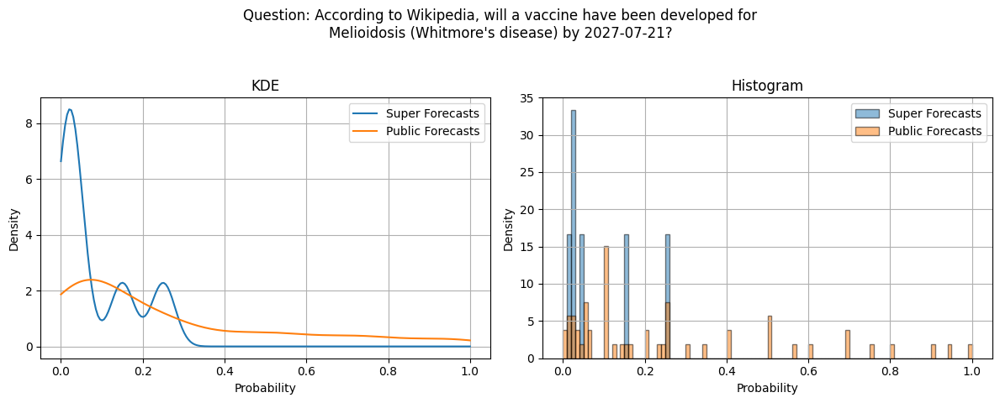

Question: According to Wikipedia, will a vaccine have been developed for
Melioidosis (Whitmore's disease) by 2027-07-21?

Public Forecasts: mean=0.258, median=0.140, std=0.273
Super Forecasts: mean=0.082, median=0.030, std=0.089


In [14]:
from delphi import ForecastDataLoader
import numpy as np
from scipy.stats import gaussian_kde
import textwrap
import matplotlib.pyplot as plt

test_id = '38ffedf32d4ca14903ace5aea31ec5a49444b8f646db87a8d0a32746c5359abe' # random vaccine question
res_date = test_resolution_date
bw = 0.3  # Try changing this value for different granularity

def compare_forecast_densities(test_id, res_date, bw):
    loader = ForecastDataLoader()

    test_question_data = loader.get_question_with_forecasts(test_id)

    super_forecasts = test_question_data['super_forecasts']
    probs_for_resolution = [
        f.forecast for f in super_forecasts if getattr(f, 'resolution_date', None) == res_date
    ]
    probs_clean = [p for p in probs_for_resolution if p is not None]

    public_forecasts = loader.get_public_forecasts(test_id)
    public_probs_for_resolution = [
        f.forecast for f in public_forecasts if getattr(f, 'resolution_date', None) == res_date
    ]
    public_probs_clean = [p for p in public_probs_for_resolution if p is not None]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # KDE plot
    ax_kde = axes[0]
    x = np.linspace(0, 1, 200)
    if len(probs_clean) > 1:
        kde_super = gaussian_kde(probs_clean, bw_method=bw)
        ax_kde.plot(x, kde_super(x), label='Super Forecasts')
    if len(public_probs_clean) > 1:
        kde_public = gaussian_kde(public_probs_clean, bw_method=bw)
        ax_kde.plot(x, kde_public(x), label='Public Forecasts')
    ax_kde.set_xlabel('Probability')
    ax_kde.set_ylabel('Density')
    ax_kde.set_title('KDE')
    ax_kde.legend()
    ax_kde.grid(True)

    # Histogram plot
    ax_hist = axes[1]
    if len(probs_clean) > 0:
        ax_hist.hist(probs_clean, bins=100, range=(0, 1), density=True, alpha=0.5, label='Super Forecasts', edgecolor='black')
    if len(public_probs_clean) > 0:
        ax_hist.hist(public_probs_clean, bins=100, range=(0, 1), density=True, alpha=0.5, label='Public Forecasts', edgecolor='black')
    ax_hist.set_xlabel('Probability')
    ax_hist.set_ylabel('Density')
    ax_hist.set_title('Histogram')
    ax_hist.legend()
    ax_hist.grid(True)

    question = test_question_data['question'].question
    # Only format if the question contains placeholders
    if '{resolution_date}' in question or '{forecast_due_date}' in question:
        wrapped_question = textwrap.fill(
            f"Question: {question.format(resolution_date=res_date, forecast_due_date=test_forecast_due_date)}",
            width=80
        )
    else:
        wrapped_question = textwrap.fill(f"Question: {question}", width=80)
    fig.suptitle(wrapped_question)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Print the question
    print(wrapped_question)
    print()

    # Compute statistics for public forecasts
    if public_probs_clean:
        public_mean = np.mean(public_probs_clean)
        public_median = np.median(public_probs_clean)
        public_std = np.std(public_probs_clean)
        print(f"Public Forecasts: mean={public_mean:.3f}, median={public_median:.3f}, std={public_std:.3f}")
    else:
        print("Public Forecasts: No data available.")

    # Compute statistics for super forecasts
    if probs_clean:
        super_mean = np.mean(probs_clean)
        super_median = np.median(probs_clean)
        super_std = np.std(probs_clean)
        print(f"Super Forecasts: mean={super_mean:.3f}, median={super_median:.3f}, std={super_std:.3f}")
    else:
        print("Super Forecasts: No data available.")

compare_forecast_densities(test_id, res_date, bw)


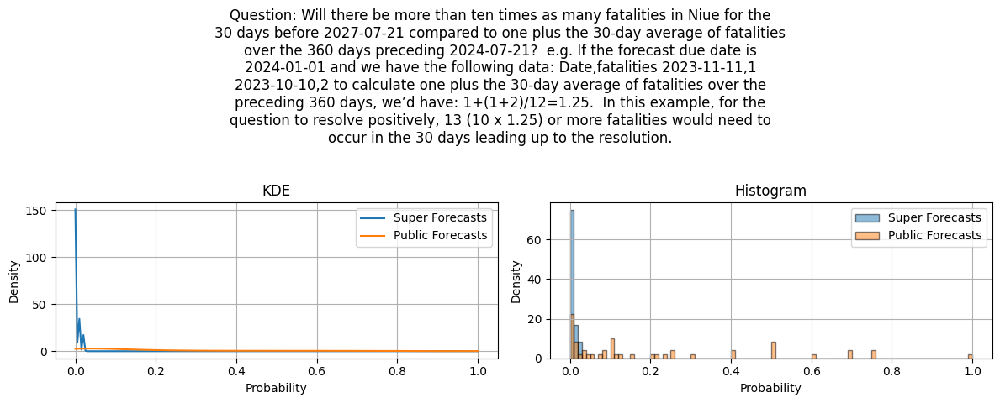

Question: Will there be more than ten times as many fatalities in Niue for the
30 days before 2027-07-21 compared to one plus the 30-day average of fatalities
over the 360 days preceding 2024-07-21?  e.g. If the forecast due date is
2024-01-01 and we have the following data: Date,fatalities 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of fatalities over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more fatalities would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.206, median=0.100, std=0.255
Super Forecasts: mean=0.004, median=0.000, std=0.006


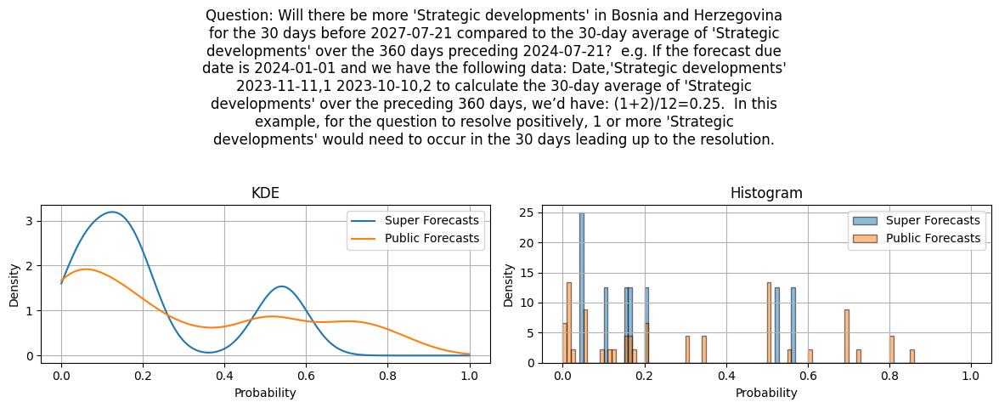

Question: Will there be more 'Strategic developments' in Bosnia and Herzegovina
for the 30 days before 2027-07-21 compared to the 30-day average of 'Strategic
developments' over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,'Strategic developments'
2023-11-11,1 2023-10-10,2 to calculate the 30-day average of 'Strategic
developments' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In this
example, for the question to resolve positively, 1 or more 'Strategic
developments' would need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.298, median=0.200, std=0.273
Super Forecasts: mean=0.221, median=0.155, std=0.192


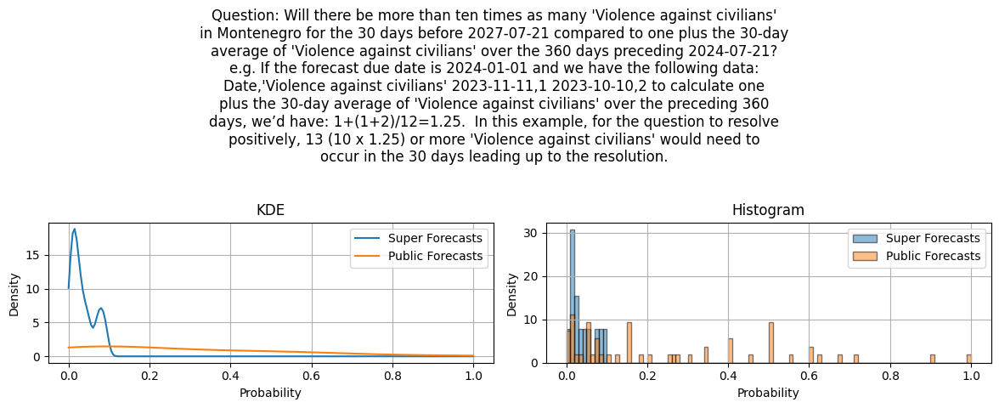

Question: Will there be more than ten times as many 'Violence against civilians'
in Montenegro for the 30 days before 2027-07-21 compared to one plus the 30-day
average of 'Violence against civilians' over the 360 days preceding 2024-07-21?
e.g. If the forecast due date is 2024-01-01 and we have the following data:
Date,'Violence against civilians' 2023-11-11,1 2023-10-10,2 to calculate one
plus the 30-day average of 'Violence against civilians' over the preceding 360
days, we’d have: 1+(1+2)/12=1.25.  In this example, for the question to resolve
positively, 13 (10 x 1.25) or more 'Violence against civilians' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.314, median=0.150, std=0.518
Super Forecasts: mean=0.035, median=0.025, std=0.028


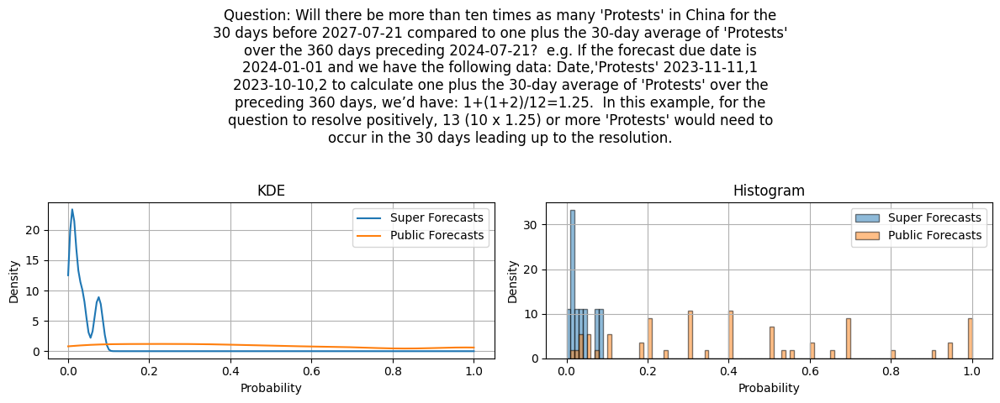

Question: Will there be more than ten times as many 'Protests' in China for the
30 days before 2027-07-21 compared to one plus the 30-day average of 'Protests'
over the 360 days preceding 2024-07-21?  e.g. If the forecast due date is
2024-01-01 and we have the following data: Date,'Protests' 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of 'Protests' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Protests' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.437, median=0.400, std=0.316
Super Forecasts: mean=0.031, median=0.020, std=0.026


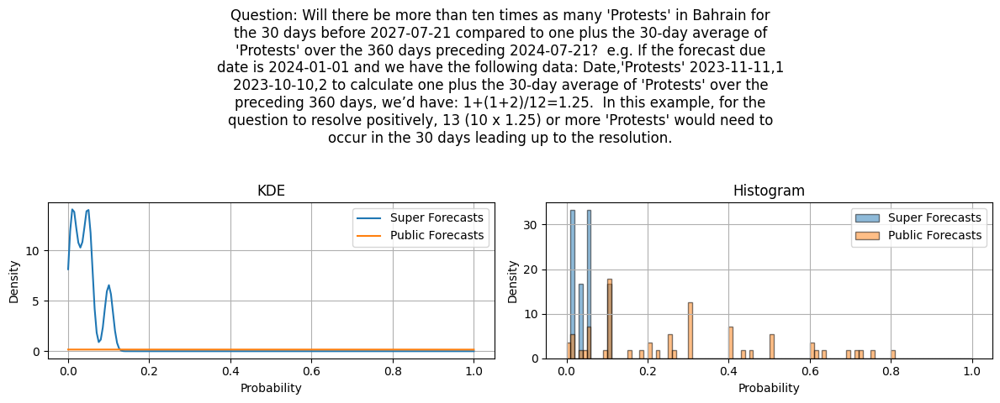

Question: Will there be more than ten times as many 'Protests' in Bahrain for
the 30 days before 2027-07-21 compared to one plus the 30-day average of
'Protests' over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,'Protests' 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of 'Protests' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Protests' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=1.324, median=0.250, std=7.829
Super Forecasts: mean=0.042, median=0.040, std=0.031


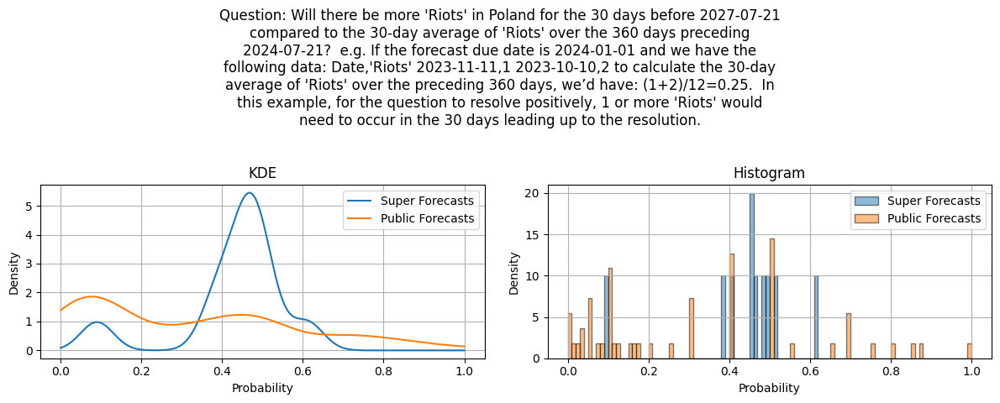

Question: Will there be more 'Riots' in Poland for the 30 days before 2027-07-21
compared to the 30-day average of 'Riots' over the 360 days preceding
2024-07-21?  e.g. If the forecast due date is 2024-01-01 and we have the
following data: Date,'Riots' 2023-11-11,1 2023-10-10,2 to calculate the 30-day
average of 'Riots' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In
this example, for the question to resolve positively, 1 or more 'Riots' would
need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.323, median=0.300, std=0.266
Super Forecasts: mean=0.433, median=0.460, std=0.129


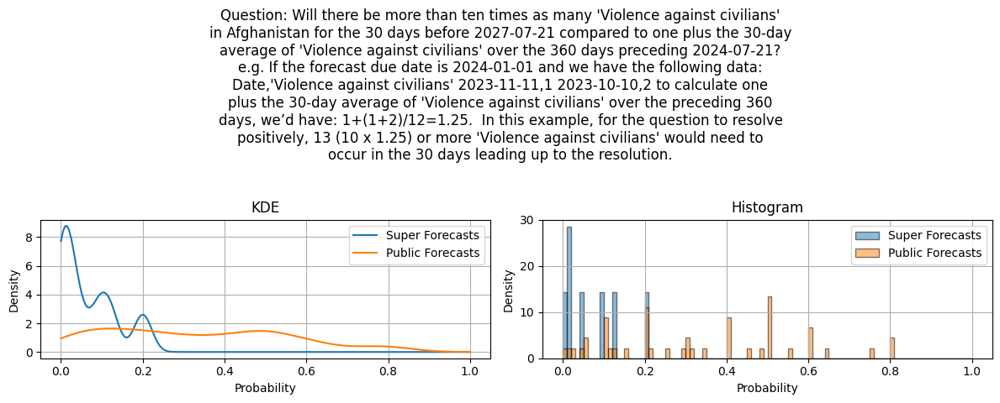

Question: Will there be more than ten times as many 'Violence against civilians'
in Afghanistan for the 30 days before 2027-07-21 compared to one plus the 30-day
average of 'Violence against civilians' over the 360 days preceding 2024-07-21?
e.g. If the forecast due date is 2024-01-01 and we have the following data:
Date,'Violence against civilians' 2023-11-11,1 2023-10-10,2 to calculate one
plus the 30-day average of 'Violence against civilians' over the preceding 360
days, we’d have: 1+(1+2)/12=1.25.  In this example, for the question to resolve
positively, 13 (10 x 1.25) or more 'Violence against civilians' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.330, median=0.300, std=0.221
Super Forecasts: mean=0.068, median=0.040, std=0.068


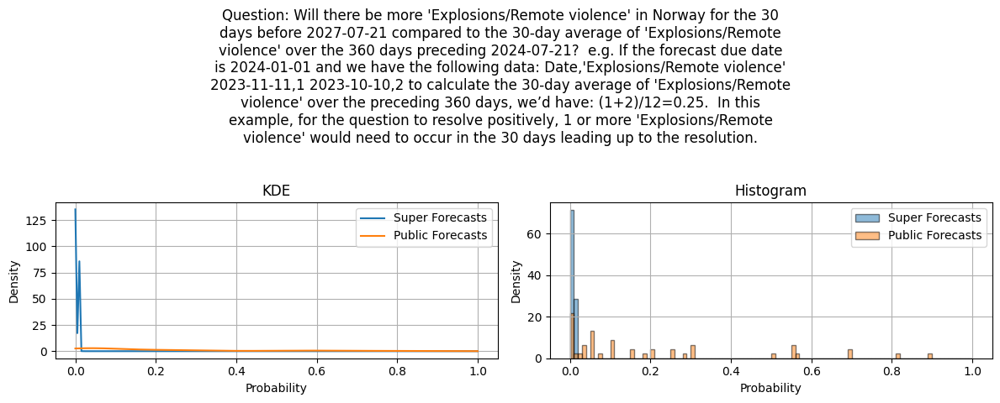

Question: Will there be more 'Explosions/Remote violence' in Norway for the 30
days before 2027-07-21 compared to the 30-day average of 'Explosions/Remote
violence' over the 360 days preceding 2024-07-21?  e.g. If the forecast due date
is 2024-01-01 and we have the following data: Date,'Explosions/Remote violence'
2023-11-11,1 2023-10-10,2 to calculate the 30-day average of 'Explosions/Remote
violence' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In this
example, for the question to resolve positively, 1 or more 'Explosions/Remote
violence' would need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.202, median=0.100, std=0.244
Super Forecasts: mean=0.004, median=0.002, std=0.004


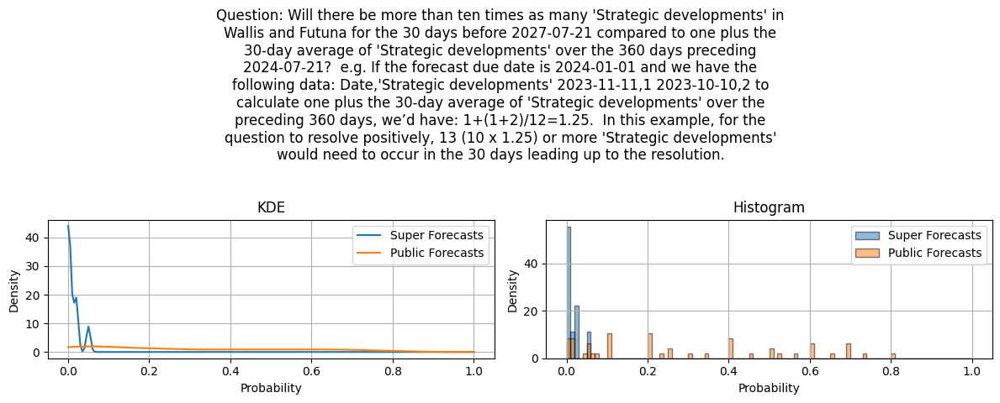

Question: Will there be more than ten times as many 'Strategic developments' in
Wallis and Futuna for the 30 days before 2027-07-21 compared to one plus the
30-day average of 'Strategic developments' over the 360 days preceding
2024-07-21?  e.g. If the forecast due date is 2024-01-01 and we have the
following data: Date,'Strategic developments' 2023-11-11,1 2023-10-10,2 to
calculate one plus the 30-day average of 'Strategic developments' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Strategic developments'
would need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.286, median=0.200, std=0.248
Super Forecasts: mean=0.012, median=0.003, std=0.016


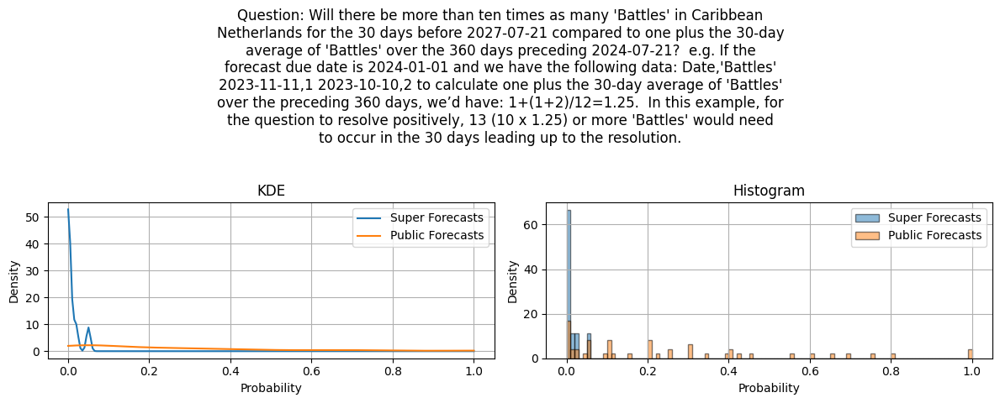

Question: Will there be more than ten times as many 'Battles' in Caribbean
Netherlands for the 30 days before 2027-07-21 compared to one plus the 30-day
average of 'Battles' over the 360 days preceding 2024-07-21?  e.g. If the
forecast due date is 2024-01-01 and we have the following data: Date,'Battles'
2023-11-11,1 2023-10-10,2 to calculate one plus the 30-day average of 'Battles'
over the preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for
the question to resolve positively, 13 (10 x 1.25) or more 'Battles' would need
to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.249, median=0.175, std=0.269
Super Forecasts: mean=0.009, median=0.000, std=0.016


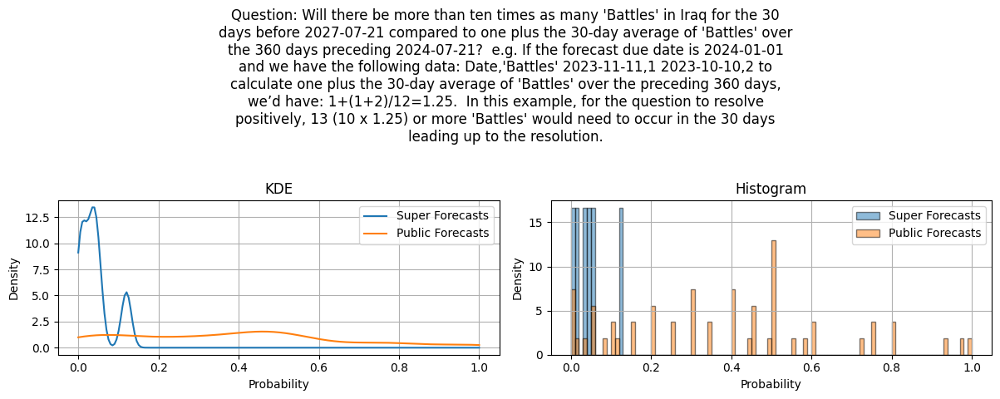

Question: Will there be more than ten times as many 'Battles' in Iraq for the 30
days before 2027-07-21 compared to one plus the 30-day average of 'Battles' over
the 360 days preceding 2024-07-21?  e.g. If the forecast due date is 2024-01-01
and we have the following data: Date,'Battles' 2023-11-11,1 2023-10-10,2 to
calculate one plus the 30-day average of 'Battles' over the preceding 360 days,
we’d have: 1+(1+2)/12=1.25.  In this example, for the question to resolve
positively, 13 (10 x 1.25) or more 'Battles' would need to occur in the 30 days
leading up to the resolution.

Public Forecasts: mean=0.376, median=0.400, std=0.266
Super Forecasts: mean=0.043, median=0.035, std=0.038


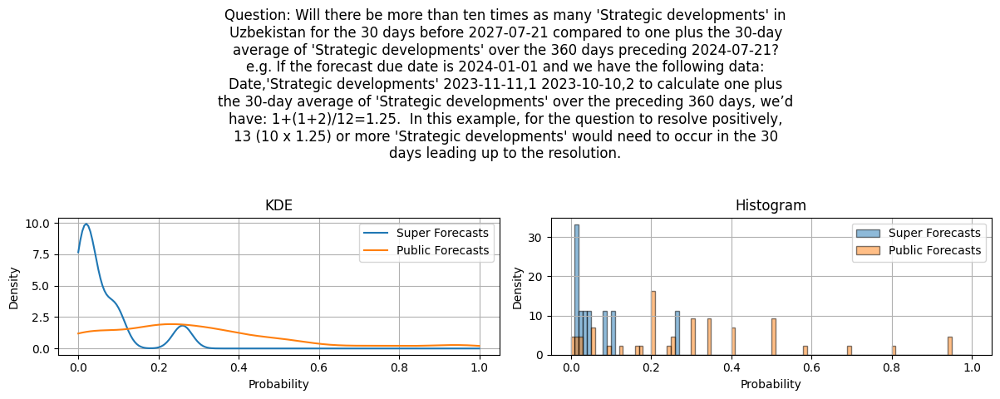

Question: Will there be more than ten times as many 'Strategic developments' in
Uzbekistan for the 30 days before 2027-07-21 compared to one plus the 30-day
average of 'Strategic developments' over the 360 days preceding 2024-07-21?
e.g. If the forecast due date is 2024-01-01 and we have the following data:
Date,'Strategic developments' 2023-11-11,1 2023-10-10,2 to calculate one plus
the 30-day average of 'Strategic developments' over the preceding 360 days, we’d
have: 1+(1+2)/12=1.25.  In this example, for the question to resolve positively,
13 (10 x 1.25) or more 'Strategic developments' would need to occur in the 30
days leading up to the resolution.

Public Forecasts: mean=0.295, median=0.250, std=0.237
Super Forecasts: mean=0.062, median=0.030, std=0.076


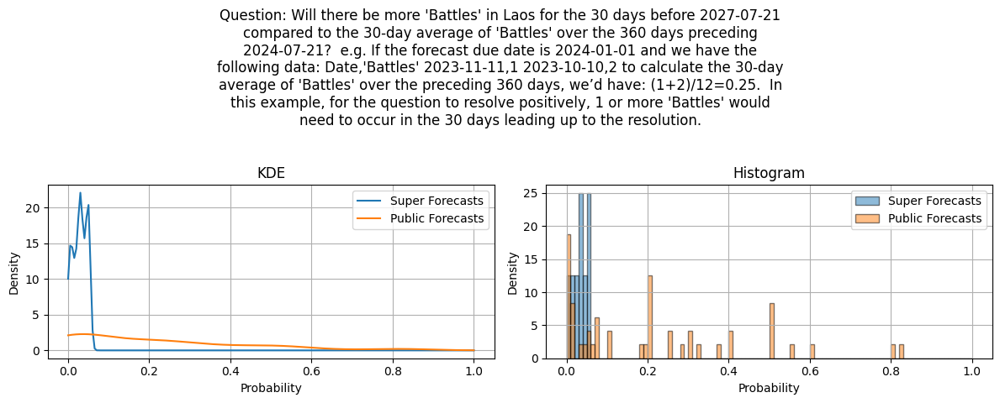

Question: Will there be more 'Battles' in Laos for the 30 days before 2027-07-21
compared to the 30-day average of 'Battles' over the 360 days preceding
2024-07-21?  e.g. If the forecast due date is 2024-01-01 and we have the
following data: Date,'Battles' 2023-11-11,1 2023-10-10,2 to calculate the 30-day
average of 'Battles' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In
this example, for the question to resolve positively, 1 or more 'Battles' would
need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.228, median=0.190, std=0.260
Super Forecasts: mean=0.029, median=0.030, std=0.016


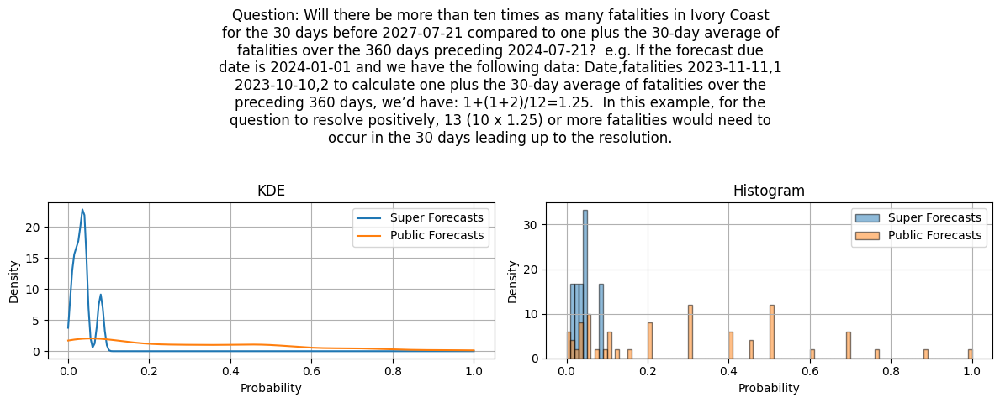

Question: Will there be more than ten times as many fatalities in Ivory Coast
for the 30 days before 2027-07-21 compared to one plus the 30-day average of
fatalities over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,fatalities 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of fatalities over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more fatalities would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.284, median=0.200, std=0.258
Super Forecasts: mean=0.037, median=0.035, std=0.022


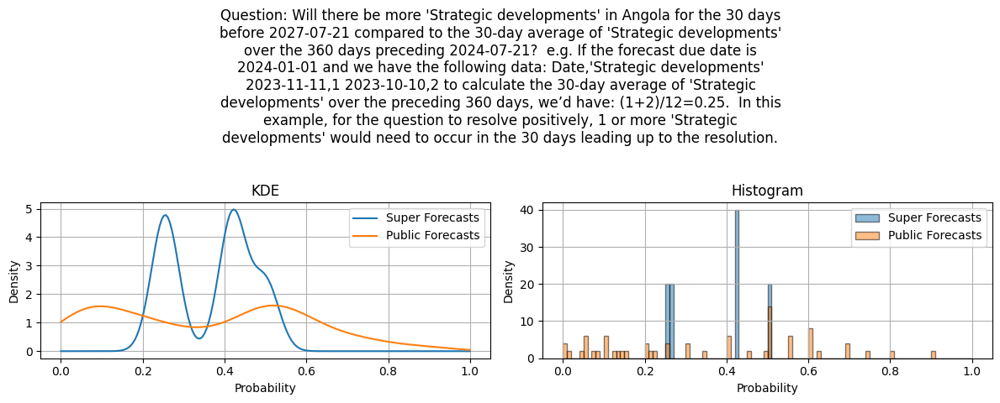

Question: Will there be more 'Strategic developments' in Angola for the 30 days
before 2027-07-21 compared to the 30-day average of 'Strategic developments'
over the 360 days preceding 2024-07-21?  e.g. If the forecast due date is
2024-01-01 and we have the following data: Date,'Strategic developments'
2023-11-11,1 2023-10-10,2 to calculate the 30-day average of 'Strategic
developments' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In this
example, for the question to resolve positively, 1 or more 'Strategic
developments' would need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.353, median=0.375, std=0.241
Super Forecasts: mean=0.370, median=0.420, std=0.098


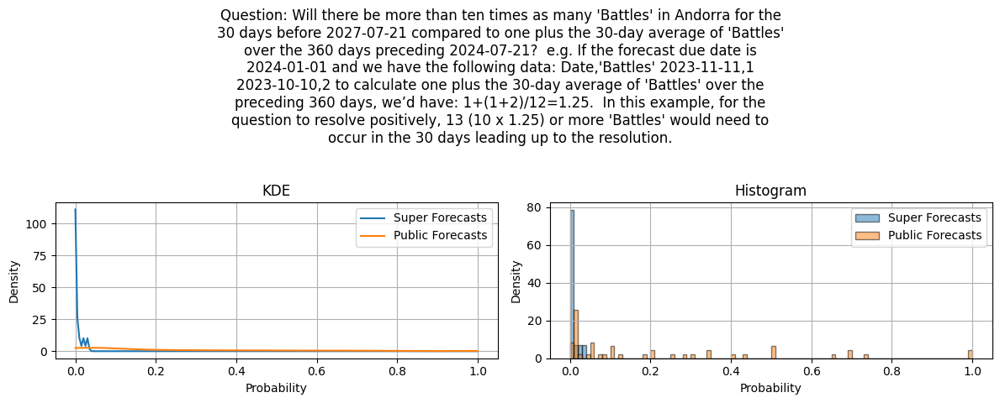

Question: Will there be more than ten times as many 'Battles' in Andorra for the
30 days before 2027-07-21 compared to one plus the 30-day average of 'Battles'
over the 360 days preceding 2024-07-21?  e.g. If the forecast due date is
2024-01-01 and we have the following data: Date,'Battles' 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of 'Battles' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Battles' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.216, median=0.080, std=0.272
Super Forecasts: mean=0.004, median=0.000, std=0.009


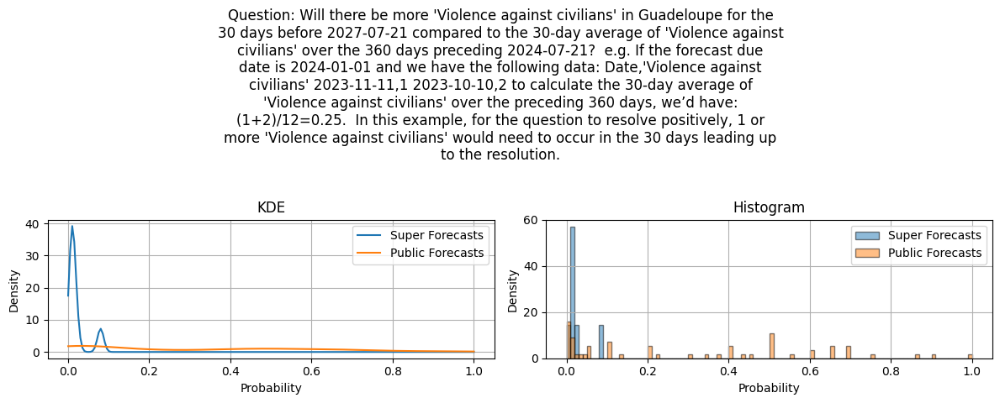

Question: Will there be more 'Violence against civilians' in Guadeloupe for the
30 days before 2027-07-21 compared to the 30-day average of 'Violence against
civilians' over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,'Violence against
civilians' 2023-11-11,1 2023-10-10,2 to calculate the 30-day average of
'Violence against civilians' over the preceding 360 days, we’d have:
(1+2)/12=0.25.  In this example, for the question to resolve positively, 1 or
more 'Violence against civilians' would need to occur in the 30 days leading up
to the resolution.

Public Forecasts: mean=0.305, median=0.210, std=0.288
Super Forecasts: mean=0.021, median=0.010, std=0.024


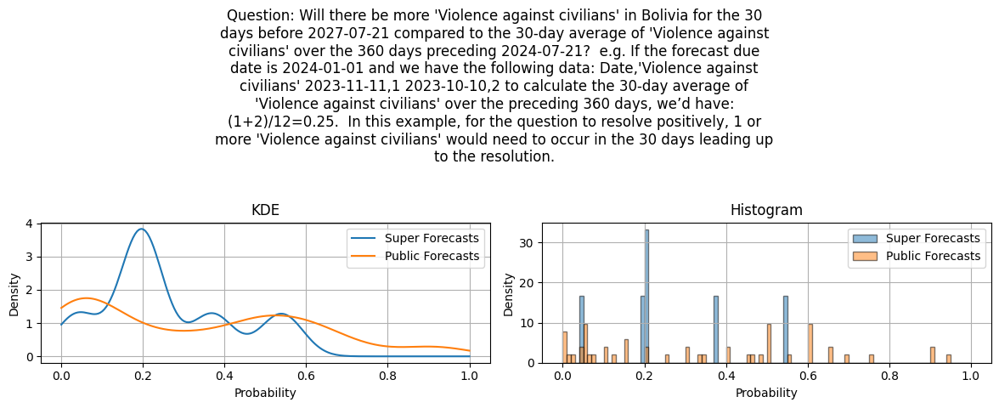

Question: Will there be more 'Violence against civilians' in Bolivia for the 30
days before 2027-07-21 compared to the 30-day average of 'Violence against
civilians' over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,'Violence against
civilians' 2023-11-11,1 2023-10-10,2 to calculate the 30-day average of
'Violence against civilians' over the preceding 360 days, we’d have:
(1+2)/12=0.25.  In this example, for the question to resolve positively, 1 or
more 'Violence against civilians' would need to occur in the 30 days leading up
to the resolution.

Public Forecasts: mean=0.332, median=0.300, std=0.273
Super Forecasts: mean=0.257, median=0.200, std=0.159


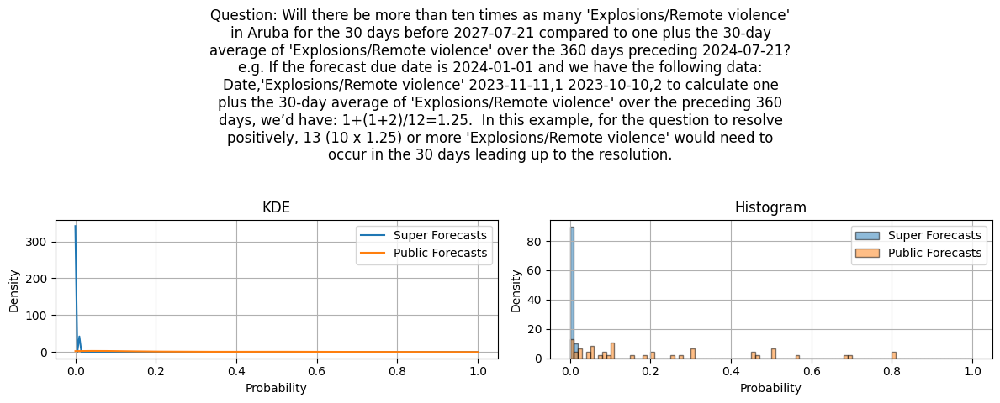

Question: Will there be more than ten times as many 'Explosions/Remote violence'
in Aruba for the 30 days before 2027-07-21 compared to one plus the 30-day
average of 'Explosions/Remote violence' over the 360 days preceding 2024-07-21?
e.g. If the forecast due date is 2024-01-01 and we have the following data:
Date,'Explosions/Remote violence' 2023-11-11,1 2023-10-10,2 to calculate one
plus the 30-day average of 'Explosions/Remote violence' over the preceding 360
days, we’d have: 1+(1+2)/12=1.25.  In this example, for the question to resolve
positively, 13 (10 x 1.25) or more 'Explosions/Remote violence' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.212, median=0.100, std=0.233
Super Forecasts: mean=0.001, median=0.000, std=0.003


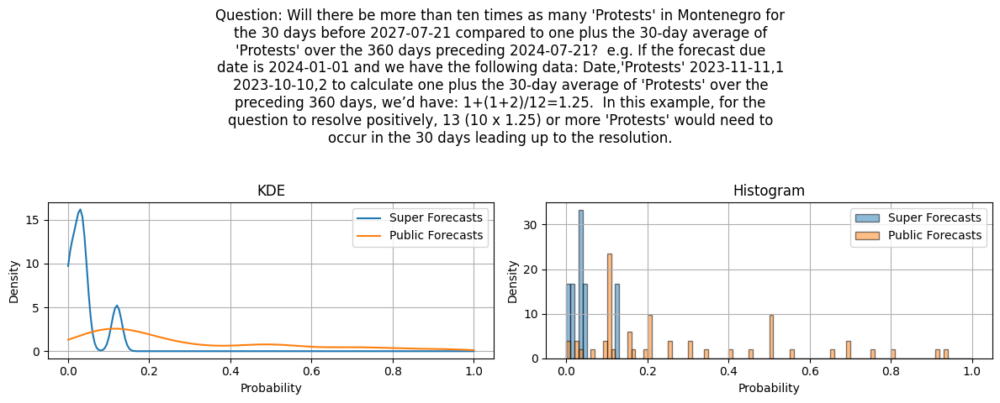

Question: Will there be more than ten times as many 'Protests' in Montenegro for
the 30 days before 2027-07-21 compared to one plus the 30-day average of
'Protests' over the 360 days preceding 2024-07-21?  e.g. If the forecast due
date is 2024-01-01 and we have the following data: Date,'Protests' 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of 'Protests' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Protests' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.279, median=0.190, std=0.249
Super Forecasts: mean=0.038, median=0.030, std=0.039


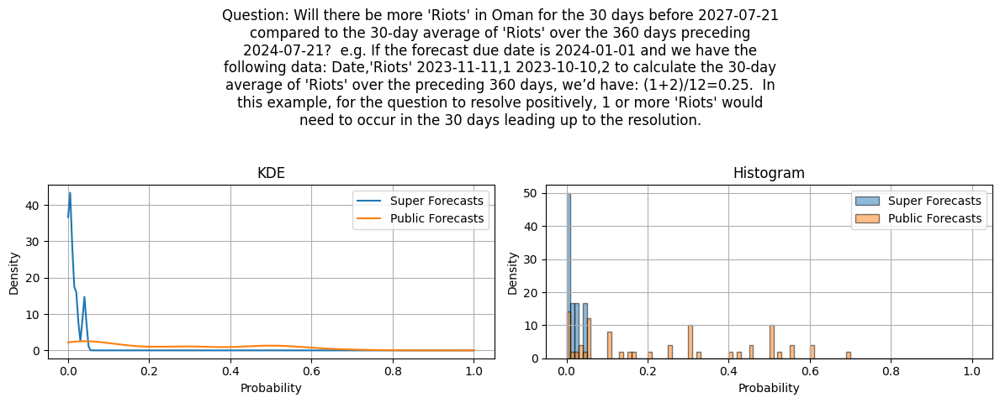

Question: Will there be more 'Riots' in Oman for the 30 days before 2027-07-21
compared to the 30-day average of 'Riots' over the 360 days preceding
2024-07-21?  e.g. If the forecast due date is 2024-01-01 and we have the
following data: Date,'Riots' 2023-11-11,1 2023-10-10,2 to calculate the 30-day
average of 'Riots' over the preceding 360 days, we’d have: (1+2)/12=0.25.  In
this example, for the question to resolve positively, 1 or more 'Riots' would
need to occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.235, median=0.160, std=0.212
Super Forecasts: mean=0.013, median=0.007, std=0.014


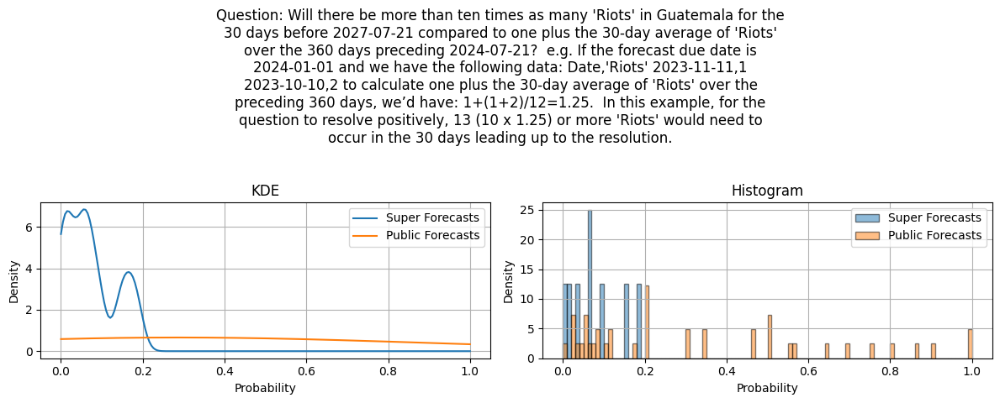

Question: Will there be more than ten times as many 'Riots' in Guatemala for the
30 days before 2027-07-21 compared to one plus the 30-day average of 'Riots'
over the 360 days preceding 2024-07-21?  e.g. If the forecast due date is
2024-01-01 and we have the following data: Date,'Riots' 2023-11-11,1
2023-10-10,2 to calculate one plus the 30-day average of 'Riots' over the
preceding 360 days, we’d have: 1+(1+2)/12=1.25.  In this example, for the
question to resolve positively, 13 (10 x 1.25) or more 'Riots' would need to
occur in the 30 days leading up to the resolution.

Public Forecasts: mean=0.586, median=0.200, std=1.665
Super Forecasts: mean=0.073, median=0.060, std=0.060


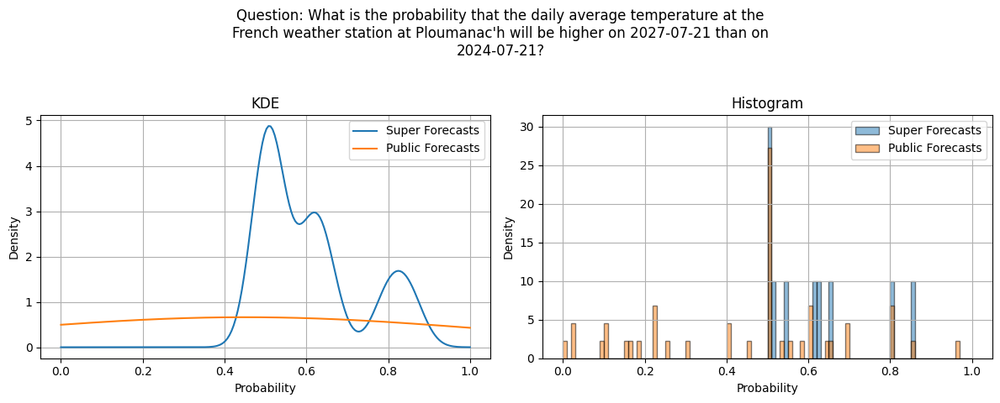

Question: What is the probability that the daily average temperature at the
French weather station at Ploumanac'h will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.711, median=0.500, std=1.769
Super Forecasts: mean=0.608, median=0.575, std=0.121


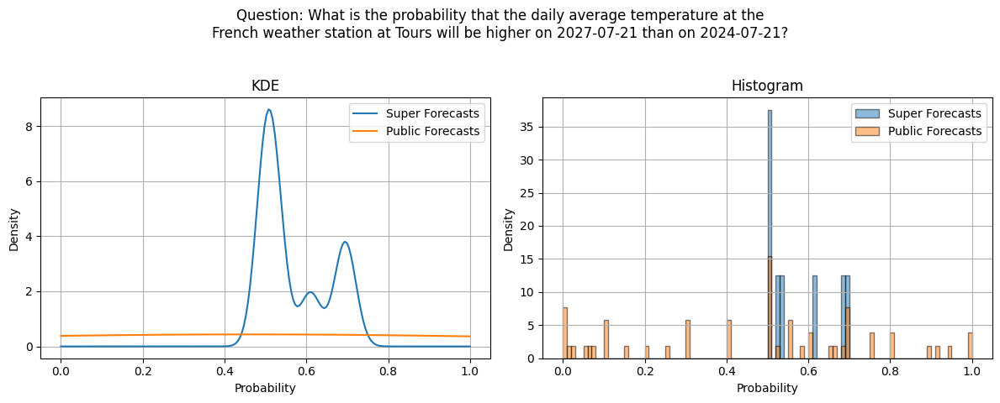

Question: What is the probability that the daily average temperature at the
French weather station at Tours will be higher on 2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.843, median=0.500, std=2.795
Super Forecasts: mean=0.569, median=0.525, std=0.080


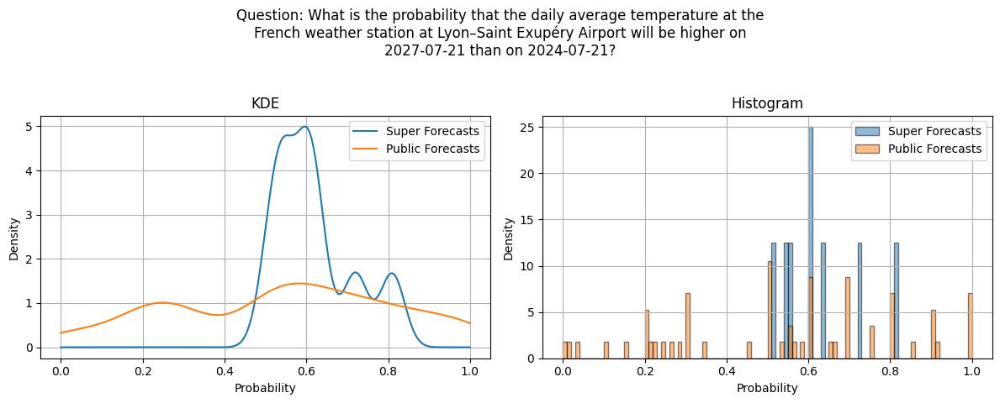

Question: What is the probability that the daily average temperature at the
French weather station at Lyon–Saint Exupéry Airport will be higher on
2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.541, median=0.560, std=0.273
Super Forecasts: mean=0.620, median=0.600, std=0.094


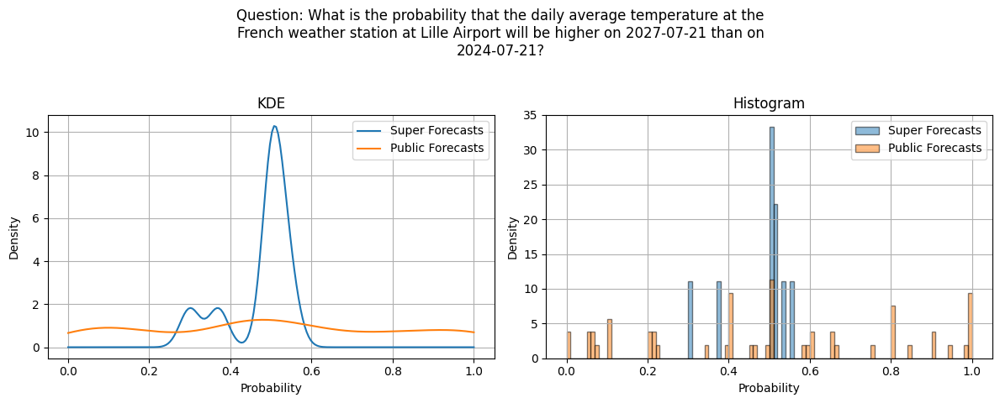

Question: What is the probability that the daily average temperature at the
French weather station at Lille Airport will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.502, median=0.500, std=0.310
Super Forecasts: mean=0.474, median=0.500, std=0.078


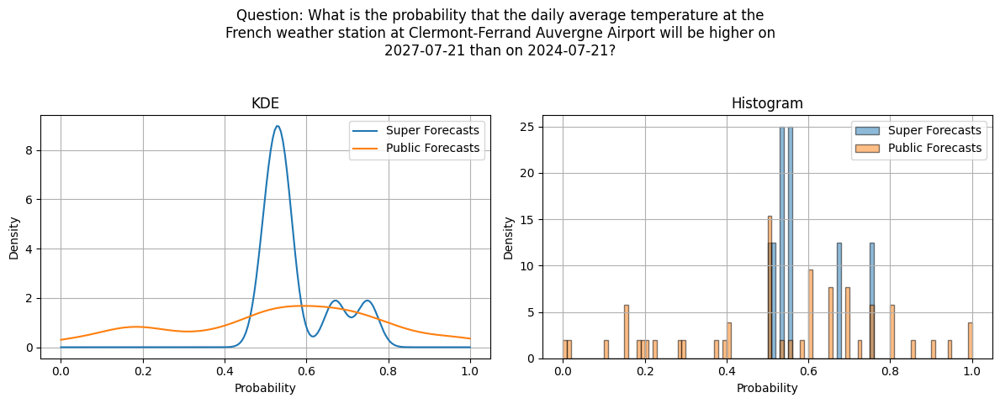

Question: What is the probability that the daily average temperature at the
French weather station at Clermont-Ferrand Auvergne Airport will be higher on
2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.531, median=0.565, std=0.251
Super Forecasts: mean=0.574, median=0.540, std=0.083


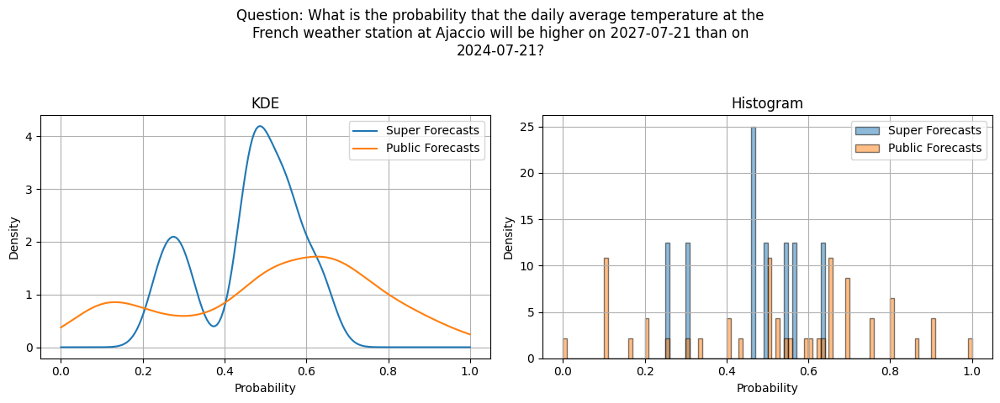

Question: What is the probability that the daily average temperature at the
French weather station at Ajaccio will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.518, median=0.545, std=0.251
Super Forecasts: mean=0.463, median=0.480, std=0.120


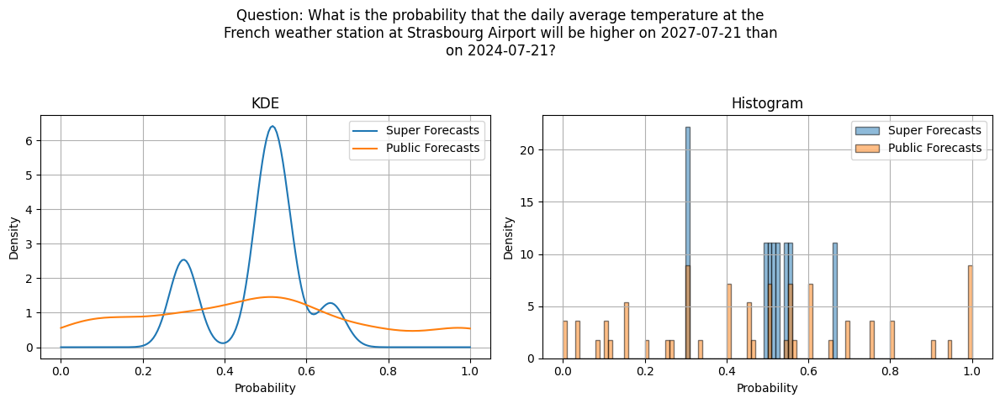

Question: What is the probability that the daily average temperature at the
French weather station at Strasbourg Airport will be higher on 2027-07-21 than
on 2024-07-21?

Public Forecasts: mean=0.474, median=0.485, std=0.283
Super Forecasts: mean=0.486, median=0.510, std=0.110


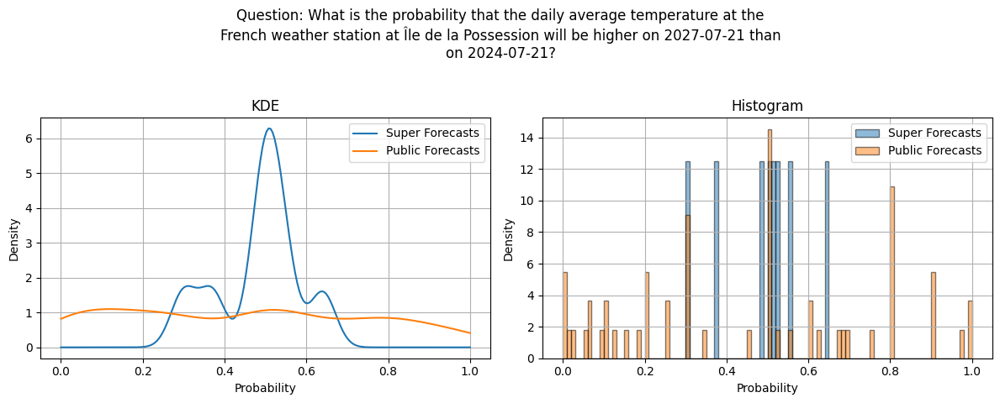

Question: What is the probability that the daily average temperature at the
French weather station at Île de la Possession will be higher on 2027-07-21 than
on 2024-07-21?

Public Forecasts: mean=0.446, median=0.500, std=0.304
Super Forecasts: mean=0.484, median=0.505, std=0.099


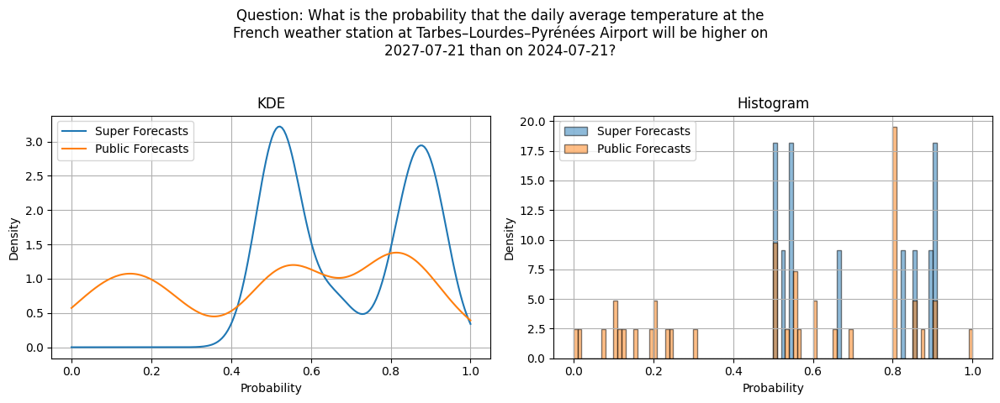

Question: What is the probability that the daily average temperature at the
French weather station at Tarbes–Lourdes–Pyrénées Airport will be higher on
2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.514, median=0.550, std=0.298
Super Forecasts: mean=0.694, median=0.660, std=0.171


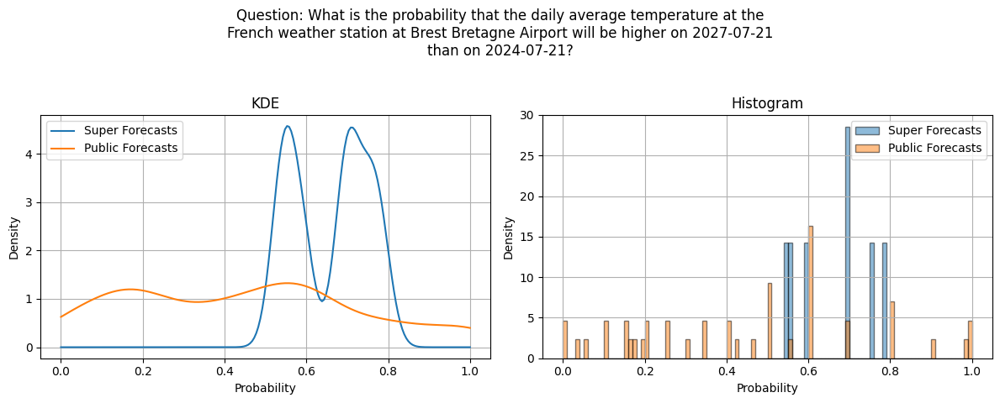

Question: What is the probability that the daily average temperature at the
French weather station at Brest Bretagne Airport will be higher on 2027-07-21
than on 2024-07-21?

Public Forecasts: mean=0.444, median=0.460, std=0.281
Super Forecasts: mean=0.659, median=0.700, std=0.090


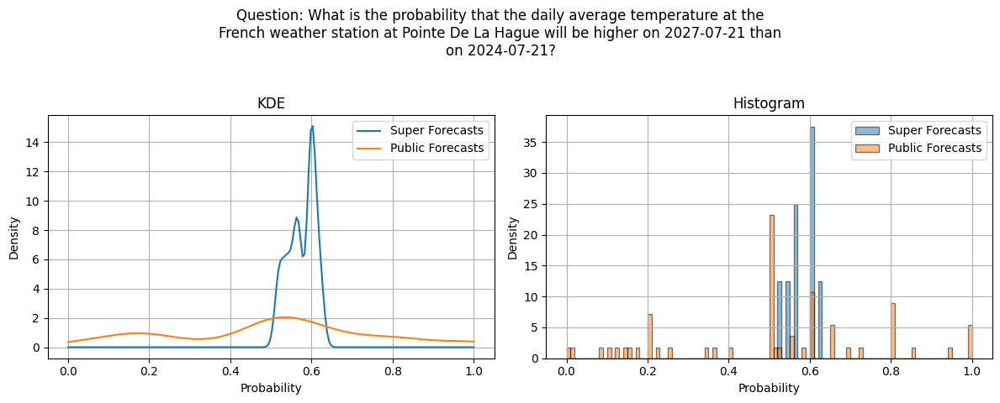

Question: What is the probability that the daily average temperature at the
French weather station at Pointe De La Hague will be higher on 2027-07-21 than
on 2024-07-21?

Public Forecasts: mean=0.502, median=0.500, std=0.255
Super Forecasts: mean=0.576, median=0.585, std=0.032


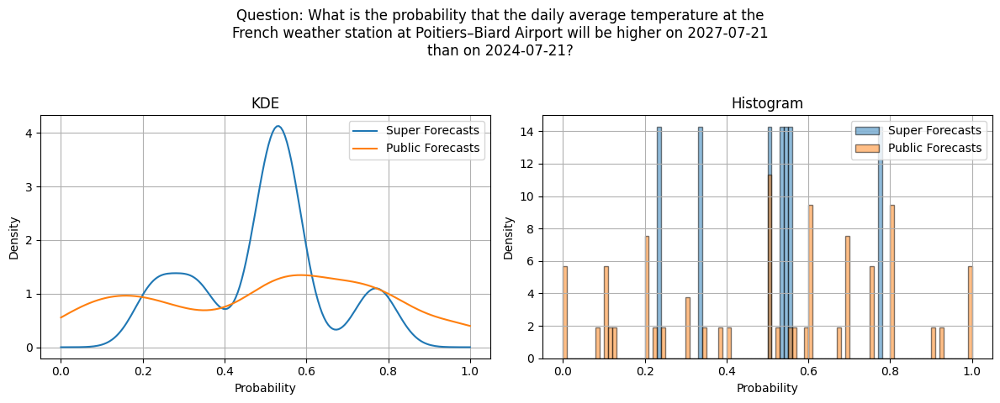

Question: What is the probability that the daily average temperature at the
French weather station at Poitiers–Biard Airport will be higher on 2027-07-21
than on 2024-07-21?

Public Forecasts: mean=0.497, median=0.520, std=0.285
Super Forecasts: mean=0.493, median=0.530, std=0.160


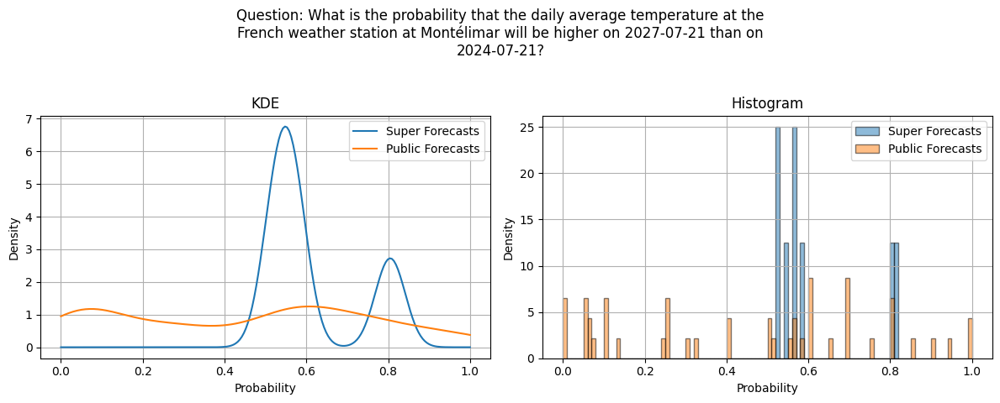

Question: What is the probability that the daily average temperature at the
French weather station at Montélimar will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.449, median=0.505, std=0.306
Super Forecasts: mean=0.613, median=0.565, std=0.113


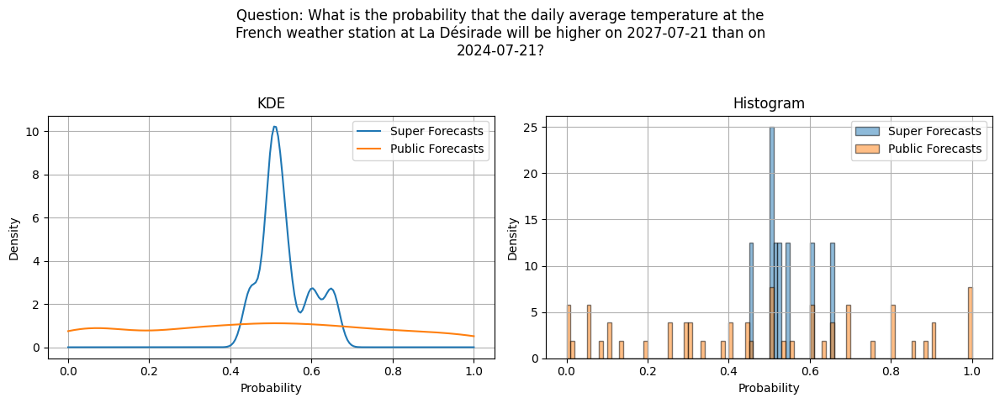

Question: What is the probability that the daily average temperature at the
French weather station at La Désirade will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.478, median=0.500, std=0.304
Super Forecasts: mean=0.534, median=0.515, std=0.059


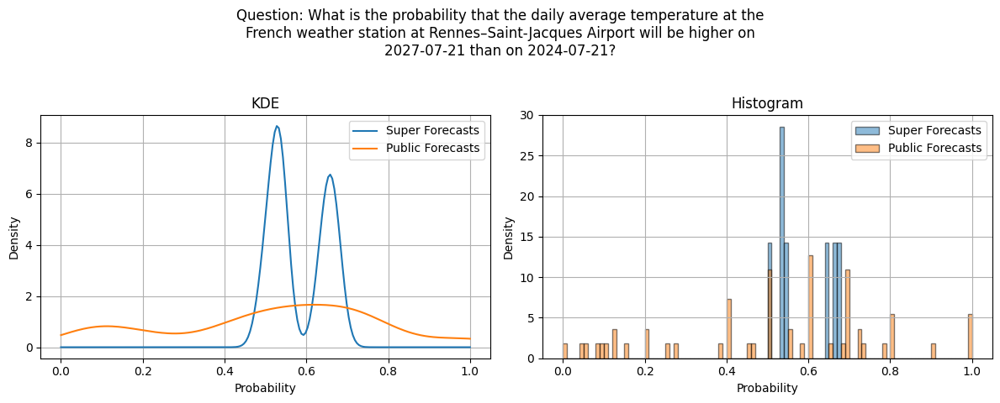

Question: What is the probability that the daily average temperature at the
French weather station at Rennes–Saint-Jacques Airport will be higher on
2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.514, median=0.550, std=0.260
Super Forecasts: mean=0.581, median=0.540, std=0.067


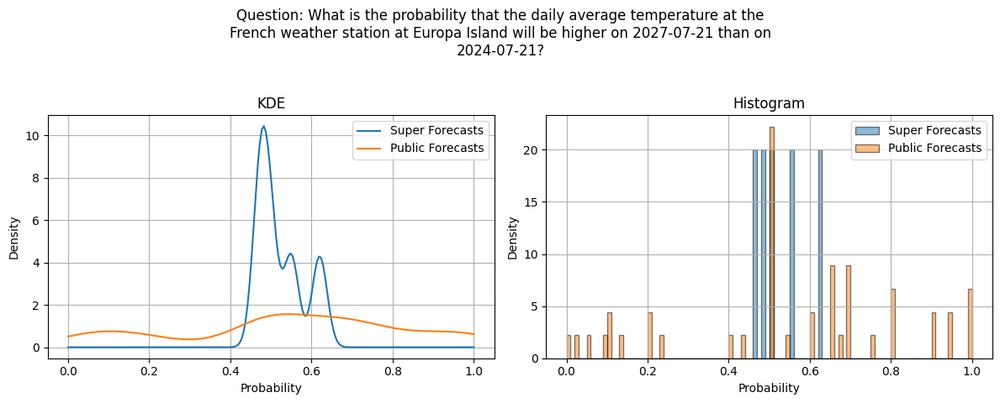

Question: What is the probability that the daily average temperature at the
French weather station at Europa Island will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.547, median=0.540, std=0.282
Super Forecasts: mean=0.524, median=0.500, std=0.055


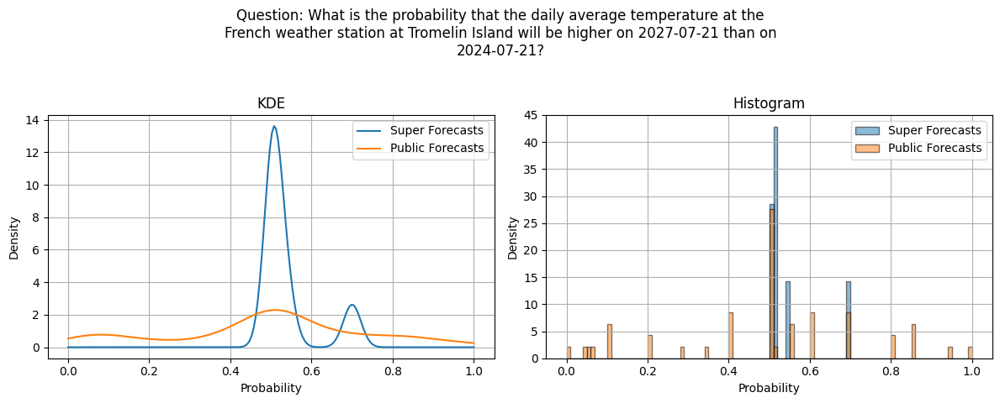

Question: What is the probability that the daily average temperature at the
French weather station at Tromelin Island will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.490, median=0.500, std=0.245
Super Forecasts: mean=0.539, median=0.510, std=0.067


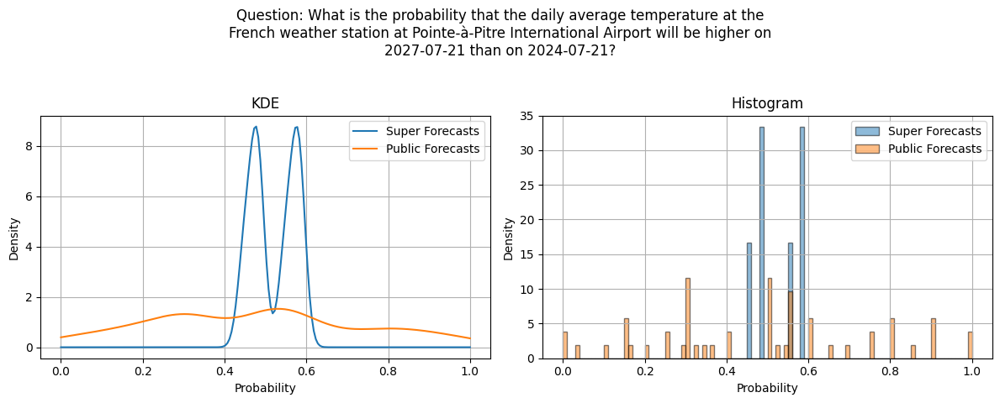

Question: What is the probability that the daily average temperature at the
French weather station at Pointe-à-Pitre International Airport will be higher on
2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.476, median=0.500, std=0.261
Super Forecasts: mean=0.520, median=0.515, std=0.052


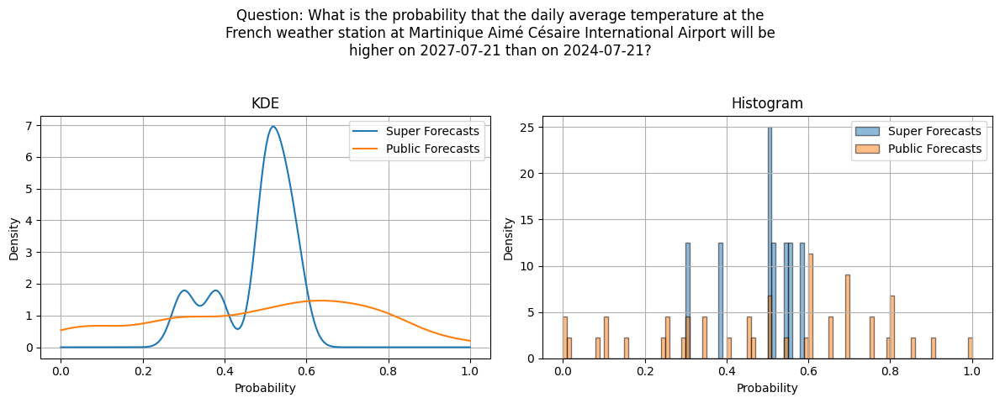

Question: What is the probability that the daily average temperature at the
French weather station at Martinique Aimé Césaire International Airport will be
higher on 2027-07-21 than on 2024-07-21?

Public Forecasts: mean=0.493, median=0.520, std=0.262
Super Forecasts: mean=0.482, median=0.505, std=0.088


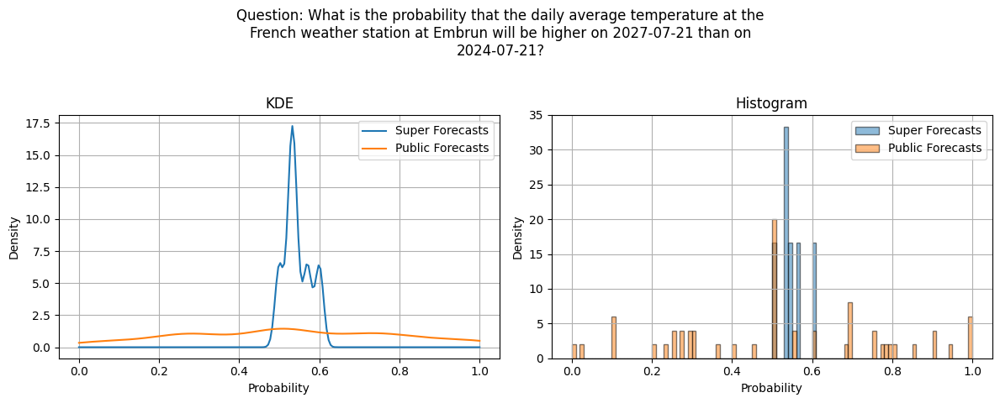

Question: What is the probability that the daily average temperature at the
French weather station at Embrun will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.524, median=0.500, std=0.268
Super Forecasts: mean=0.545, median=0.535, std=0.032


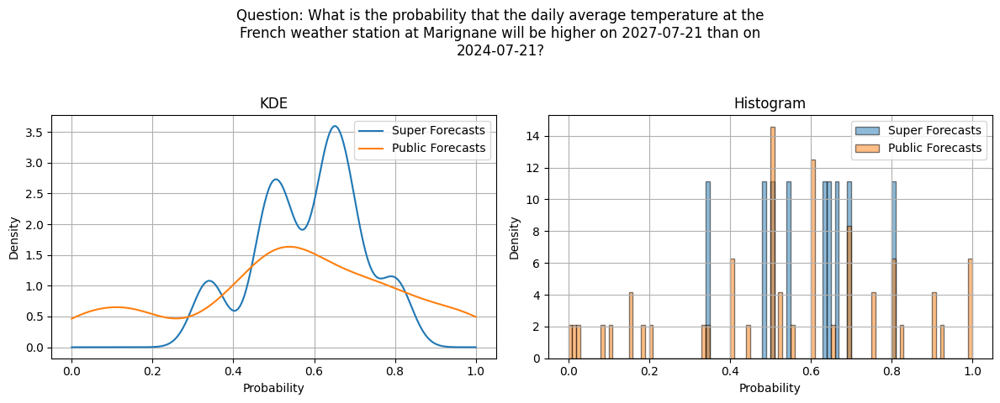

Question: What is the probability that the daily average temperature at the
French weather station at Marignane will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.538, median=0.535, std=0.270
Super Forecasts: mean=0.588, median=0.630, std=0.129


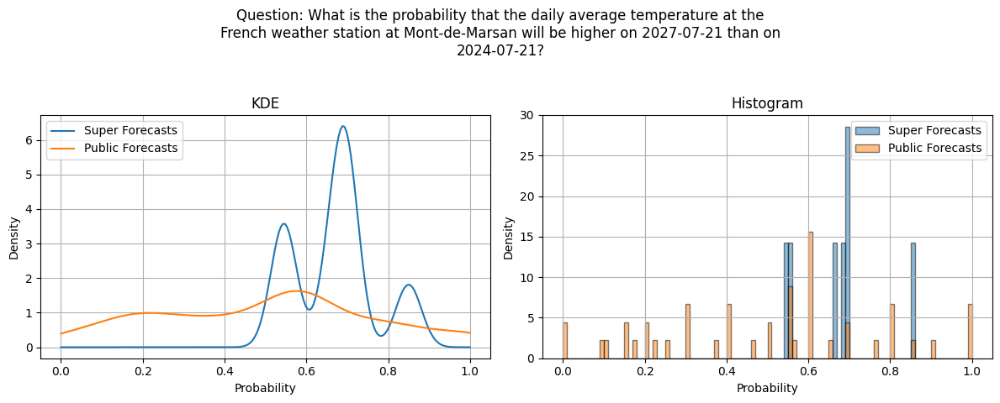

Question: What is the probability that the daily average temperature at the
French weather station at Mont-de-Marsan will be higher on 2027-07-21 than on
2024-07-21?

Public Forecasts: mean=0.498, median=0.550, std=0.268
Super Forecasts: mean=0.670, median=0.690, std=0.097


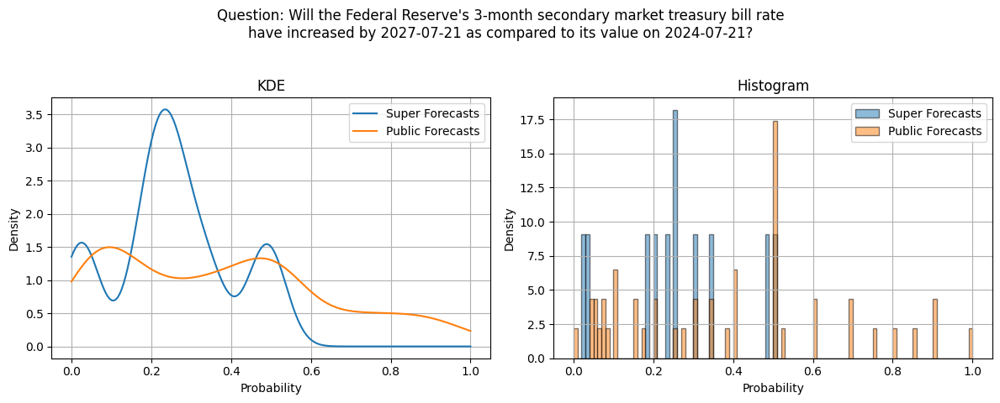

Question: Will the Federal Reserve's 3-month secondary market treasury bill rate
have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.377, median=0.365, std=0.271
Super Forecasts: mean=0.254, median=0.250, std=0.147


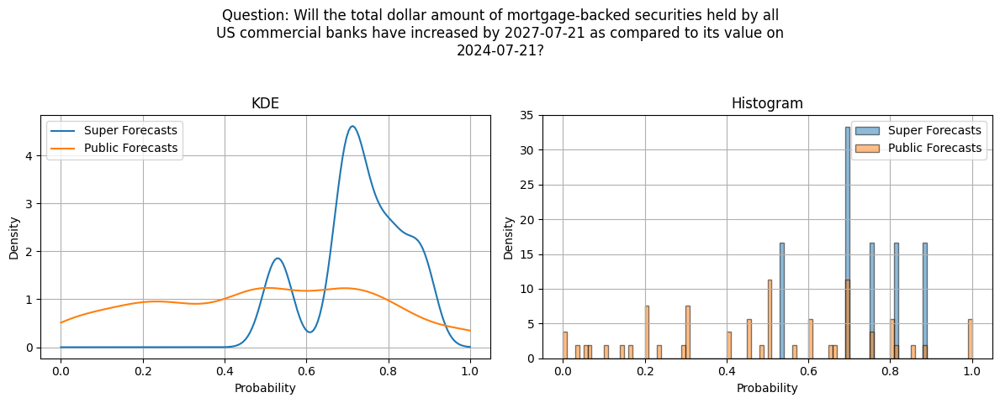

Question: Will the total dollar amount of mortgage-backed securities held by all
US commercial banks have increased by 2027-07-21 as compared to its value on
2024-07-21?

Public Forecasts: mean=0.491, median=0.500, std=0.275
Super Forecasts: mean=0.728, median=0.725, std=0.109


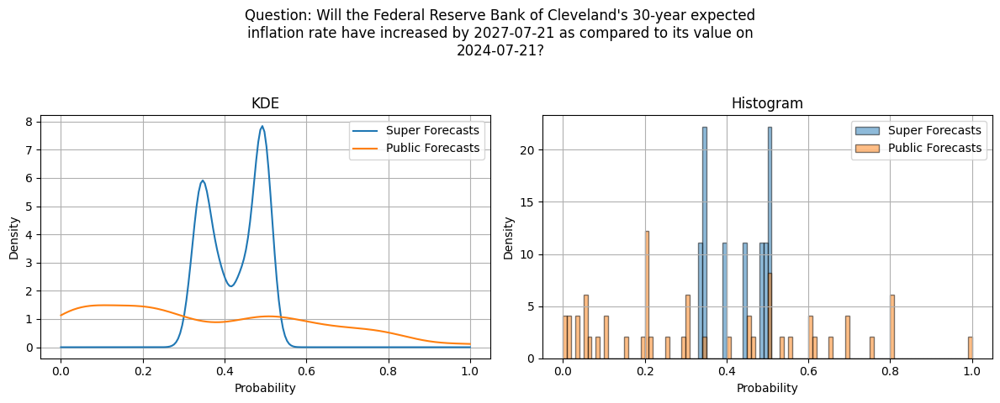

Question: Will the Federal Reserve Bank of Cleveland's 30-year expected
inflation rate have increased by 2027-07-21 as compared to its value on
2024-07-21?

Public Forecasts: mean=0.347, median=0.300, std=0.263
Super Forecasts: mean=0.426, median=0.440, std=0.067


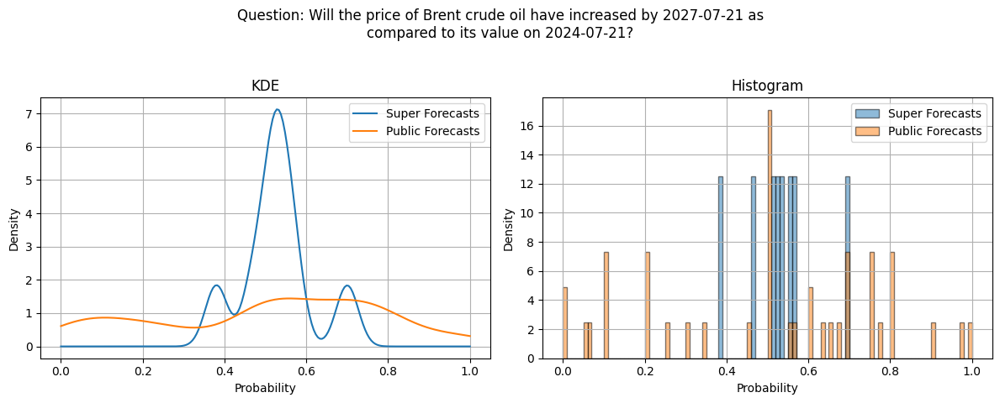

Question: Will the price of Brent crude oil have increased by 2027-07-21 as
compared to its value on 2024-07-21?

Public Forecasts: mean=0.500, median=0.500, std=0.277
Super Forecasts: mean=0.529, median=0.525, std=0.085


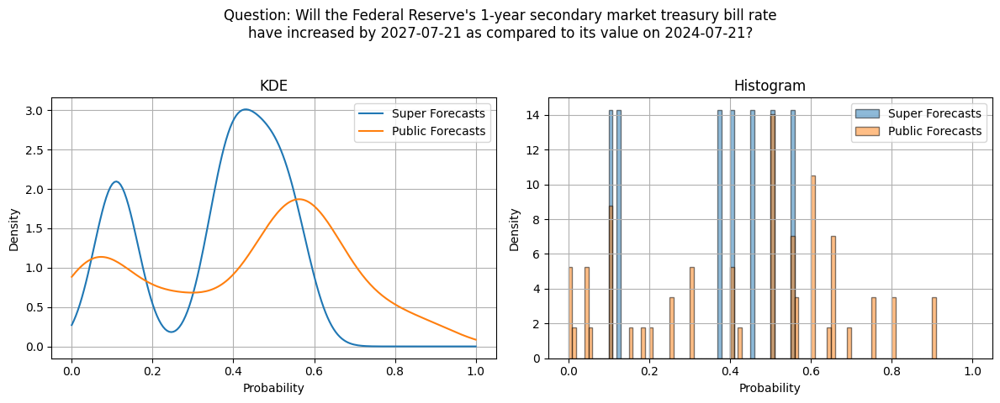

Question: Will the Federal Reserve's 1-year secondary market treasury bill rate
have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.422, median=0.500, std=0.255
Super Forecasts: mean=0.356, median=0.400, std=0.165


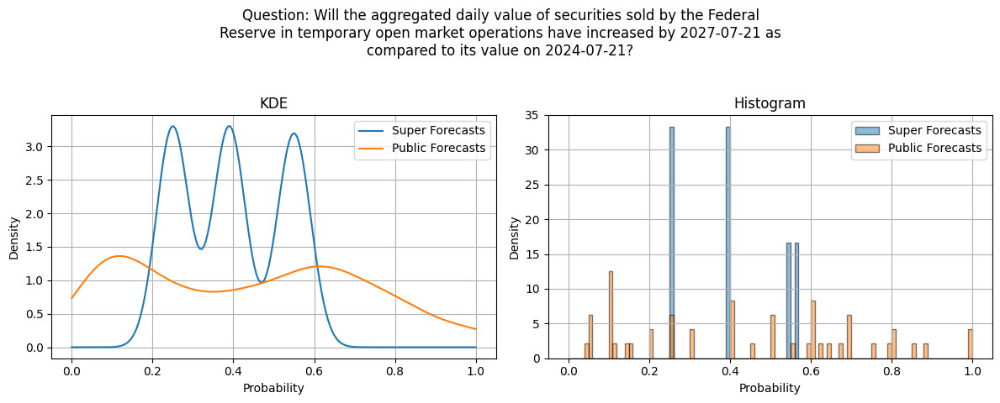

Question: Will the aggregated daily value of securities sold by the Federal
Reserve in temporary open market operations have increased by 2027-07-21 as
compared to its value on 2024-07-21?

Public Forecasts: mean=0.436, median=0.425, std=0.282
Super Forecasts: mean=0.397, median=0.390, std=0.123


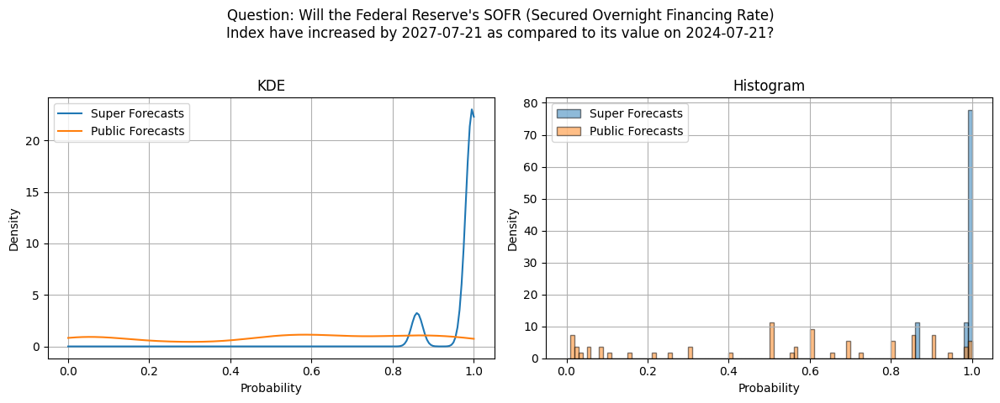

Question: Will the Federal Reserve's SOFR (Secured Overnight Financing Rate)
Index have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.529, median=0.585, std=0.332
Super Forecasts: mean=0.980, median=1.000, std=0.043


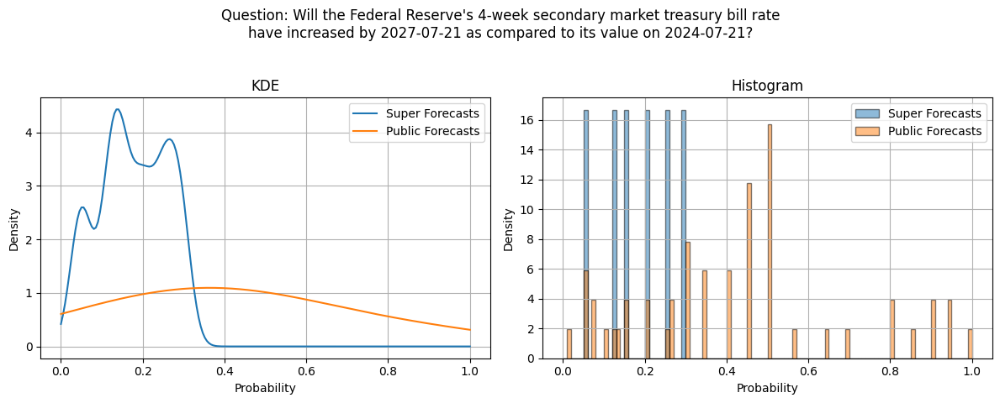

Question: Will the Federal Reserve's 4-week secondary market treasury bill rate
have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.526, median=0.425, std=0.810
Super Forecasts: mean=0.177, median=0.175, std=0.080


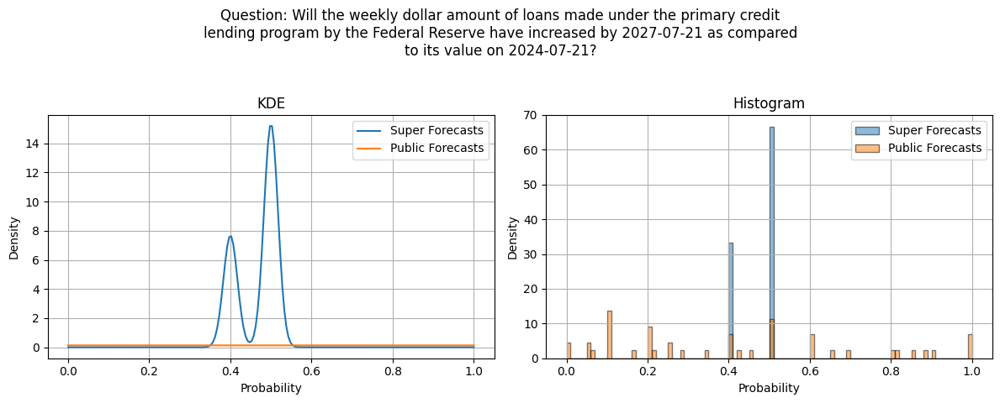

Question: Will the weekly dollar amount of loans made under the primary credit
lending program by the Federal Reserve have increased by 2027-07-21 as compared
to its value on 2024-07-21?

Public Forecasts: mean=1.912, median=0.400, std=9.972
Super Forecasts: mean=0.467, median=0.500, std=0.047


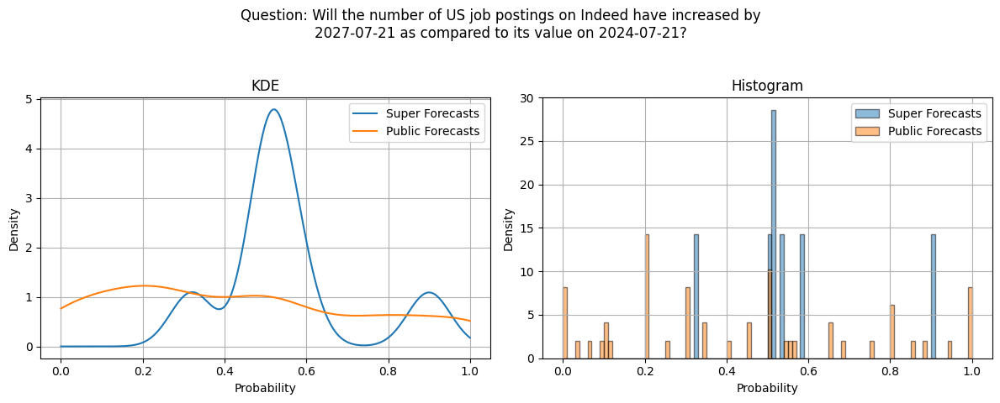

Question: Will the number of US job postings on Indeed have increased by
2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.435, median=0.400, std=0.308
Super Forecasts: mean=0.550, median=0.510, std=0.161


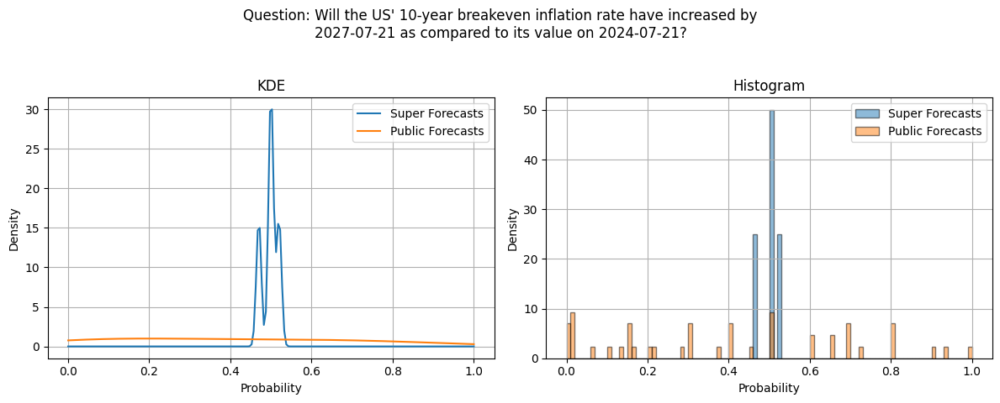

Question: Will the US' 10-year breakeven inflation rate have increased by
2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.495, median=0.400, std=0.538
Super Forecasts: mean=0.497, median=0.500, std=0.018


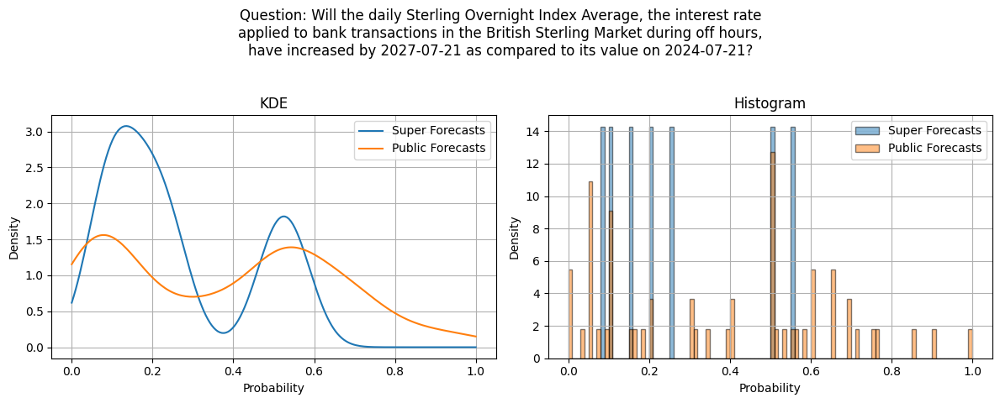

Question: Will the daily Sterling Overnight Index Average, the interest rate
applied to bank transactions in the British Sterling Market during off hours,
have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.376, median=0.400, std=0.272
Super Forecasts: mean=0.261, median=0.200, std=0.175


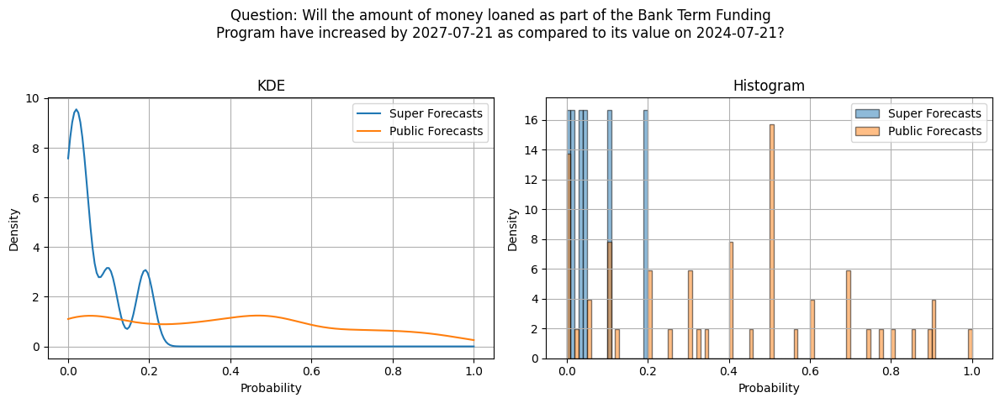

Question: Will the amount of money loaned as part of the Bank Term Funding
Program have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.389, median=0.400, std=0.290
Super Forecasts: mean=0.062, median=0.035, std=0.066


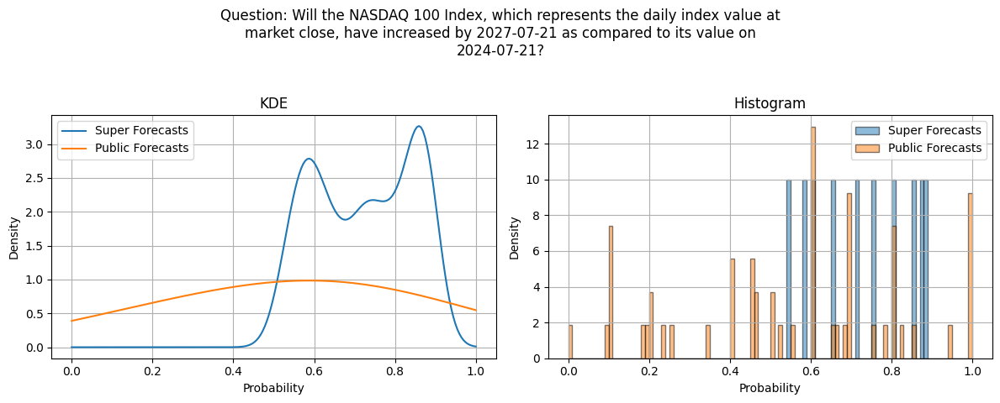

Question: Will the NASDAQ 100 Index, which represents the daily index value at
market close, have increased by 2027-07-21 as compared to its value on
2024-07-21?

Public Forecasts: mean=0.667, median=0.600, std=0.904
Super Forecasts: mean=0.723, median=0.730, std=0.120


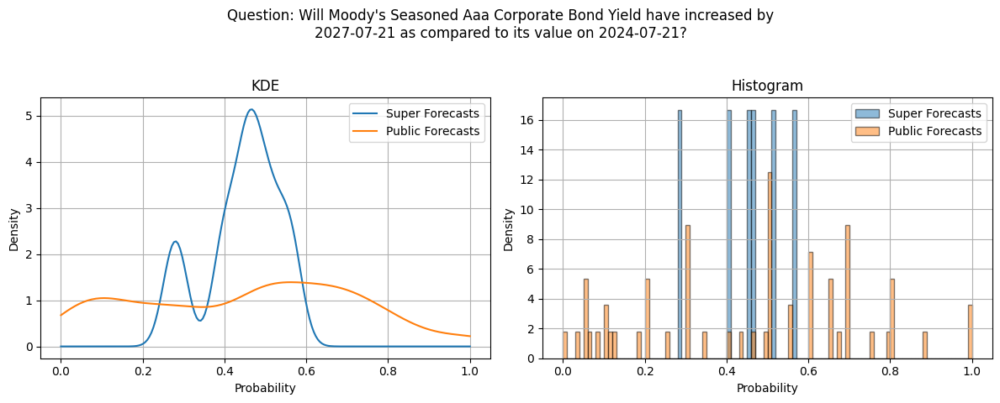

Question: Will Moody's Seasoned Aaa Corporate Bond Yield have increased by
2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.453, median=0.500, std=0.268
Super Forecasts: mean=0.445, median=0.460, std=0.089


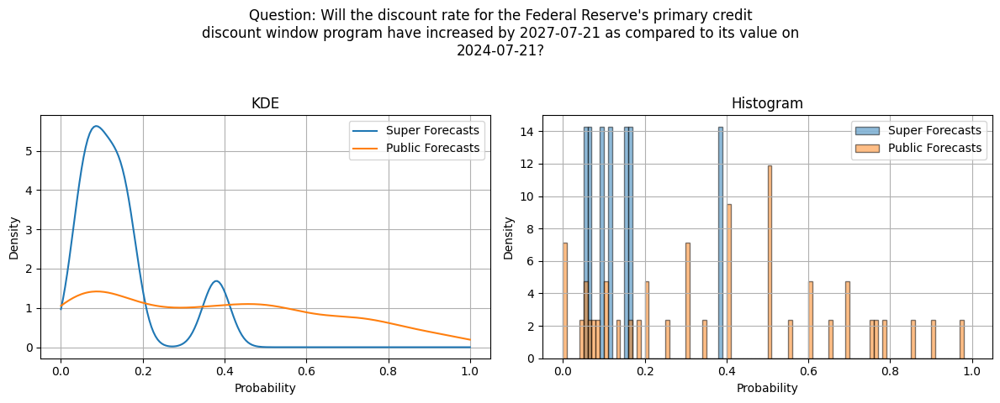

Question: Will the discount rate for the Federal Reserve's primary credit
discount window program have increased by 2027-07-21 as compared to its value on
2024-07-21?

Public Forecasts: mean=0.377, median=0.375, std=0.277
Super Forecasts: mean=0.143, median=0.110, std=0.104


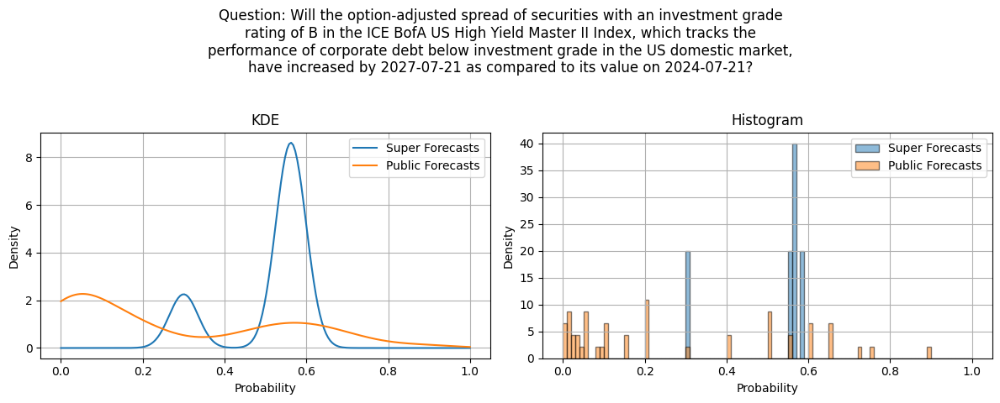

Question: Will the option-adjusted spread of securities with an investment grade
rating of B in the ICE BofA US High Yield Master II Index, which tracks the
performance of corporate debt below investment grade in the US domestic market,
have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.271, median=0.175, std=0.262
Super Forecasts: mean=0.510, median=0.560, std=0.105


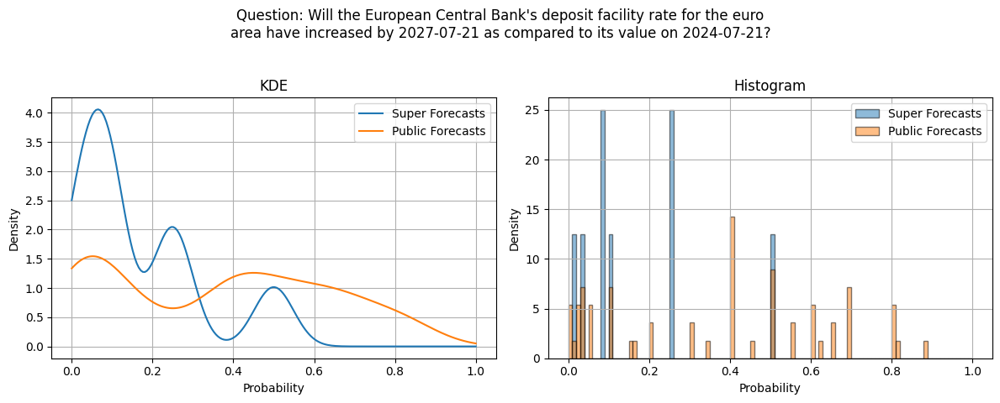

Question: Will the European Central Bank's deposit facility rate for the euro
area have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.363, median=0.400, std=0.271
Super Forecasts: mean=0.163, median=0.090, std=0.153


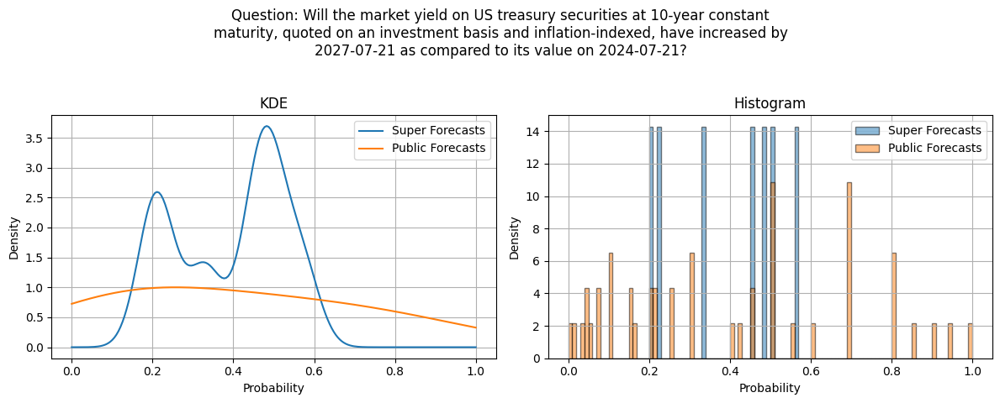

Question: Will the market yield on US treasury securities at 10-year constant
maturity, quoted on an investment basis and inflation-indexed, have increased by
2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.495, median=0.400, std=0.725
Super Forecasts: mean=0.393, median=0.450, std=0.133


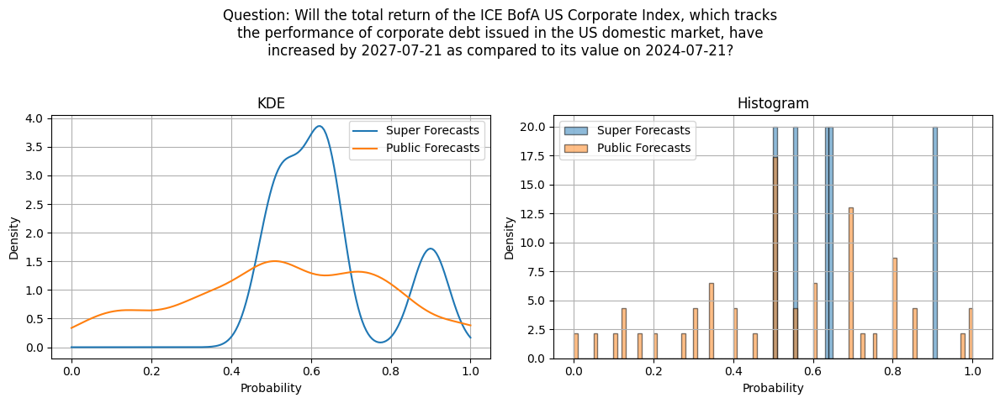

Question: Will the total return of the ICE BofA US Corporate Index, which tracks
the performance of corporate debt issued in the US domestic market, have
increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.530, median=0.500, std=0.256
Super Forecasts: mean=0.644, median=0.630, std=0.138


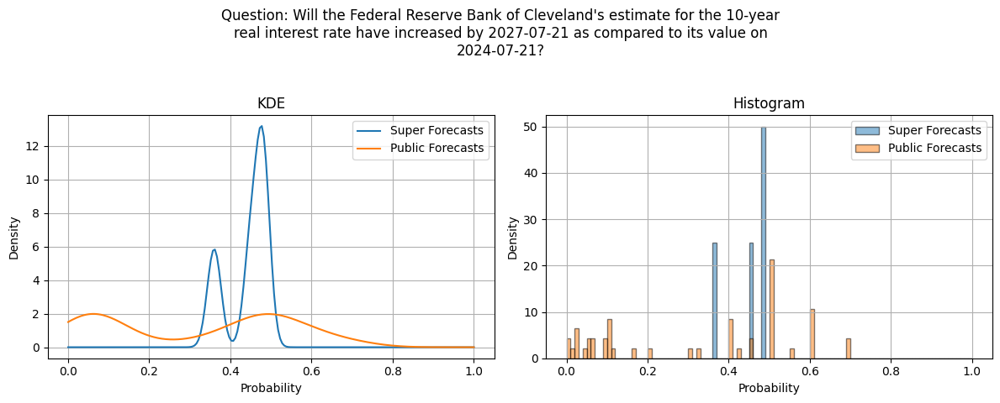

Question: Will the Federal Reserve Bank of Cleveland's estimate for the 10-year
real interest rate have increased by 2027-07-21 as compared to its value on
2024-07-21?

Public Forecasts: mean=0.317, median=0.400, std=0.228
Super Forecasts: mean=0.442, median=0.465, std=0.049


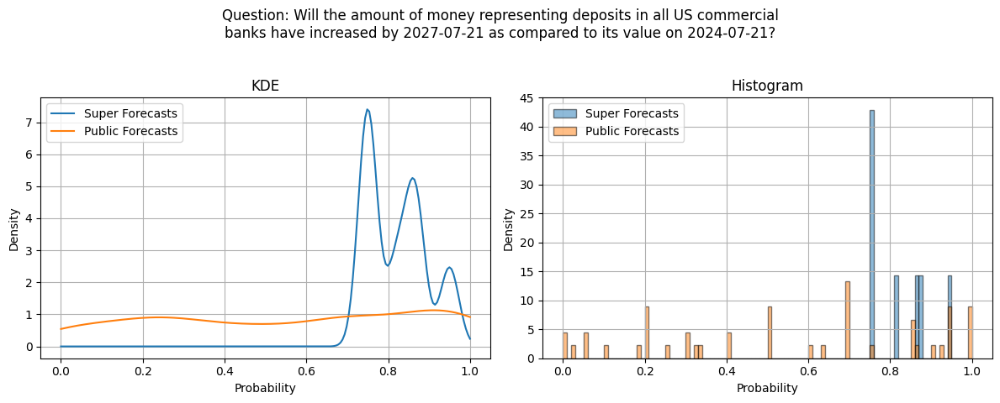

Question: Will the amount of money representing deposits in all US commercial
banks have increased by 2027-07-21 as compared to its value on 2024-07-21?

Public Forecasts: mean=0.549, median=0.600, std=0.328
Super Forecasts: mean=0.821, median=0.820, std=0.071


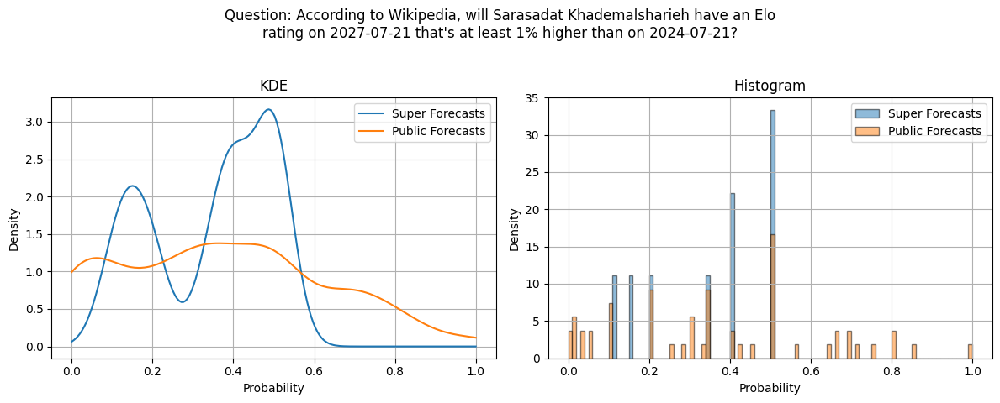

Question: According to Wikipedia, will Sarasadat Khademalsharieh have an Elo
rating on 2027-07-21 that's at least 1% higher than on 2024-07-21?

Public Forecasts: mean=0.372, median=0.350, std=0.254
Super Forecasts: mean=0.347, median=0.400, std=0.147


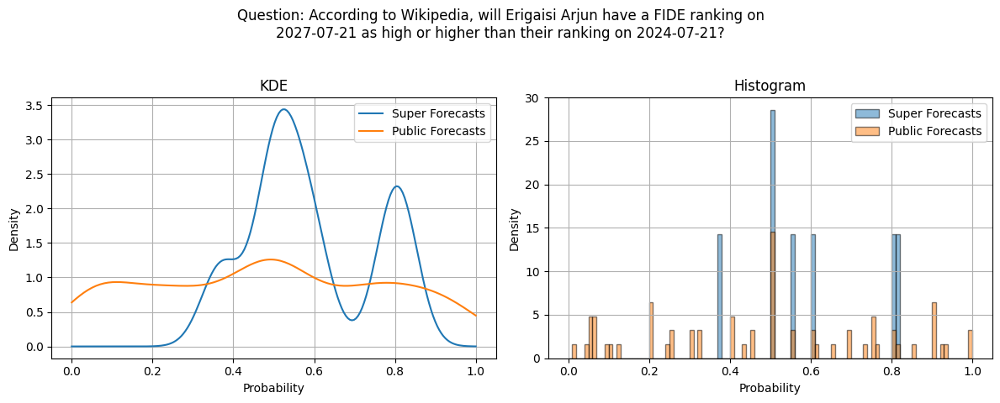

Question: According to Wikipedia, will Erigaisi Arjun have a FIDE ranking on
2027-07-21 as high or higher than their ranking on 2024-07-21?

Public Forecasts: mean=0.483, median=0.500, std=0.289
Super Forecasts: mean=0.590, median=0.550, std=0.151


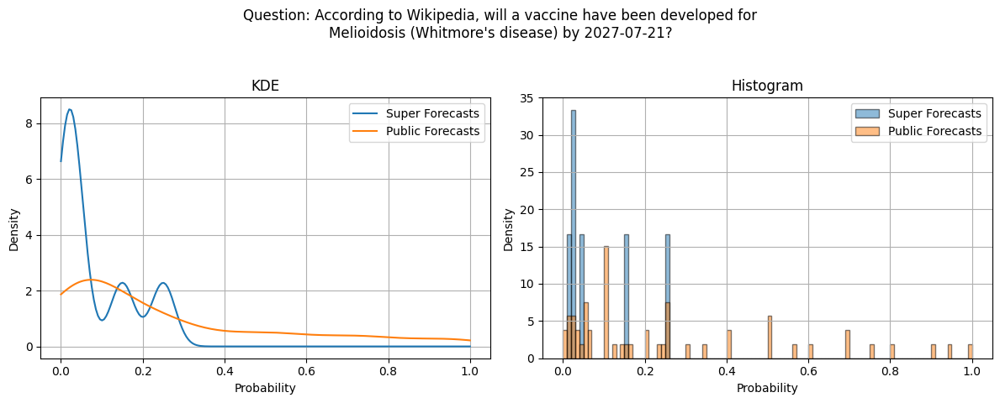

Question: According to Wikipedia, will a vaccine have been developed for
Melioidosis (Whitmore's disease) by 2027-07-21?

Public Forecasts: mean=0.258, median=0.140, std=0.273
Super Forecasts: mean=0.082, median=0.030, std=0.089


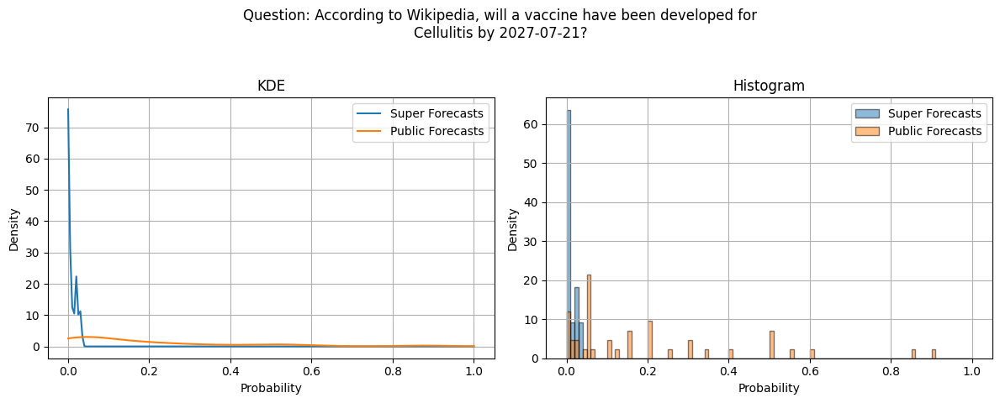

Question: According to Wikipedia, will a vaccine have been developed for
Cellulitis by 2027-07-21?

Public Forecasts: mean=0.195, median=0.100, std=0.227
Super Forecasts: mean=0.007, median=0.000, std=0.010


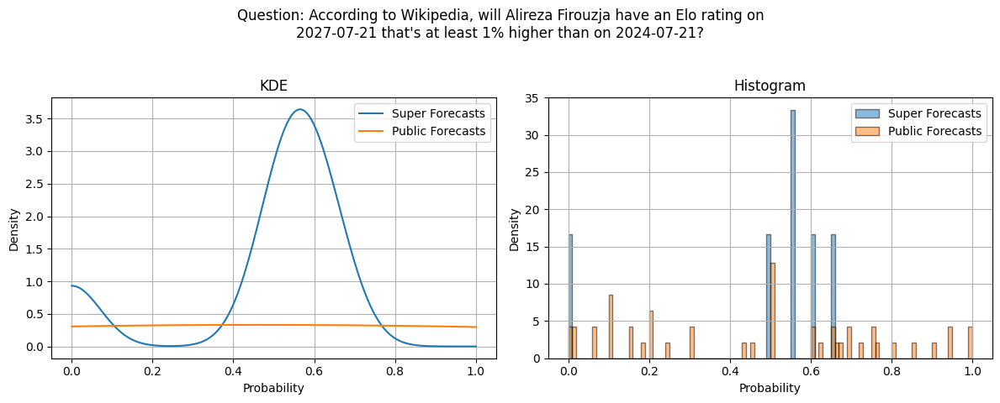

Question: According to Wikipedia, will Alireza Firouzja have an Elo rating on
2027-07-21 that's at least 1% higher than on 2024-07-21?

Public Forecasts: mean=1.006, median=0.500, std=3.753
Super Forecasts: mean=0.473, median=0.550, std=0.217


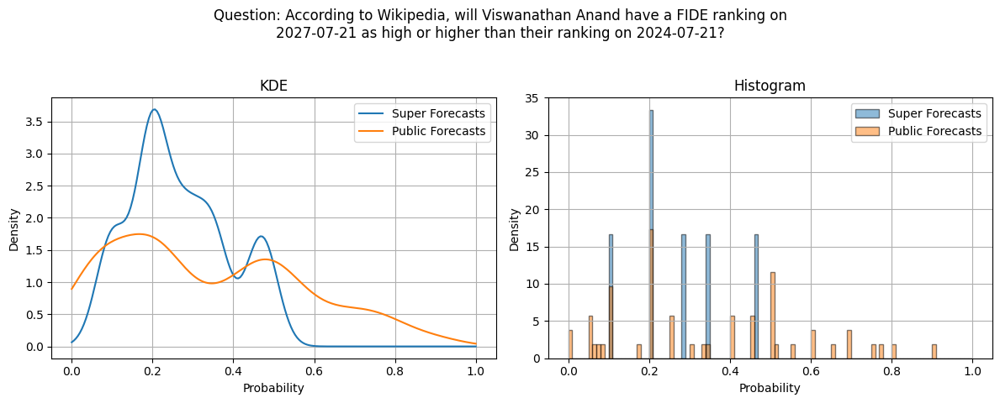

Question: According to Wikipedia, will Viswanathan Anand have a FIDE ranking on
2027-07-21 as high or higher than their ranking on 2024-07-21?

Public Forecasts: mean=0.339, median=0.275, std=0.235
Super Forecasts: mean=0.267, median=0.240, std=0.119


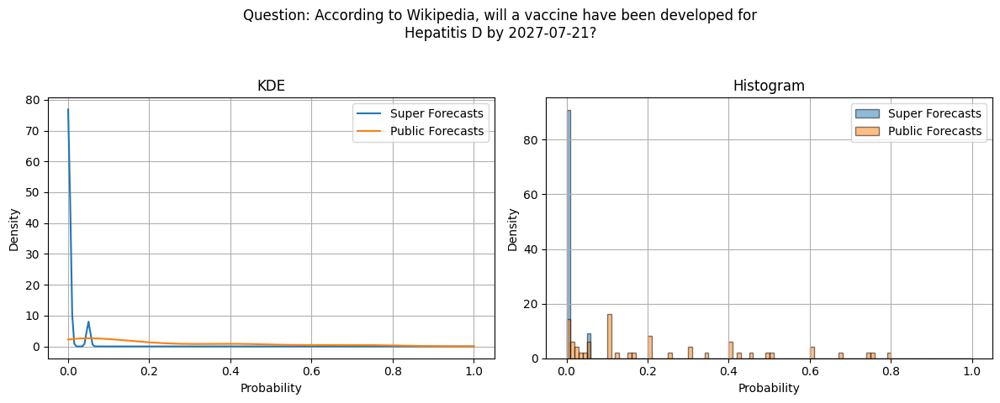

Question: According to Wikipedia, will a vaccine have been developed for
Hepatitis D by 2027-07-21?

Public Forecasts: mean=0.219, median=0.100, std=0.229
Super Forecasts: mean=0.005, median=0.000, std=0.014


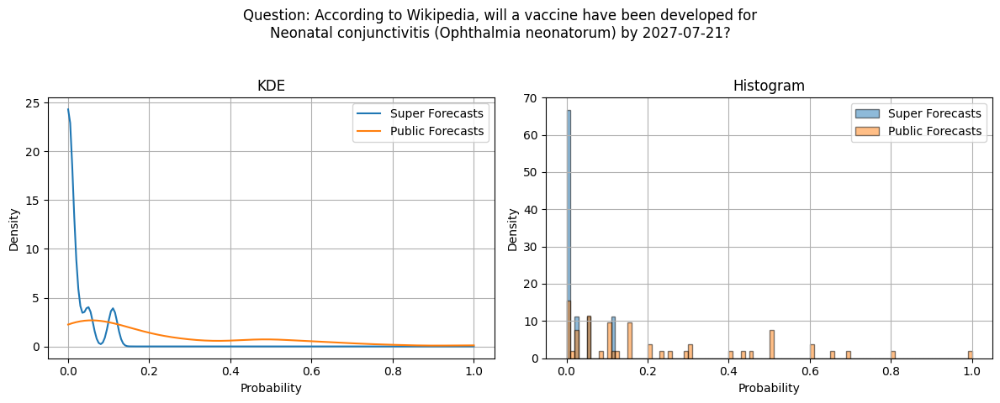

Question: According to Wikipedia, will a vaccine have been developed for
Neonatal conjunctivitis (Ophthalmia neonatorum) by 2027-07-21?

Public Forecasts: mean=0.218, median=0.115, std=0.241
Super Forecasts: mean=0.020, median=0.000, std=0.036


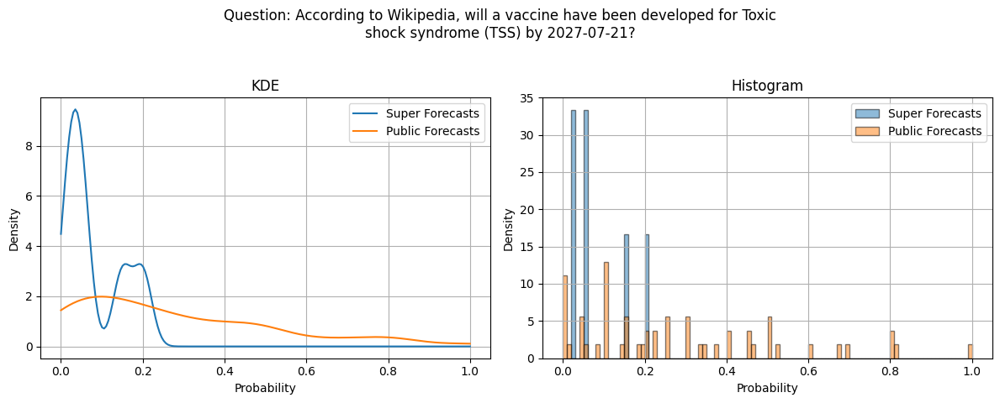

Question: According to Wikipedia, will a vaccine have been developed for Toxic
shock syndrome (TSS) by 2027-07-21?

Public Forecasts: mean=0.278, median=0.210, std=0.246
Super Forecasts: mean=0.082, median=0.050, std=0.069


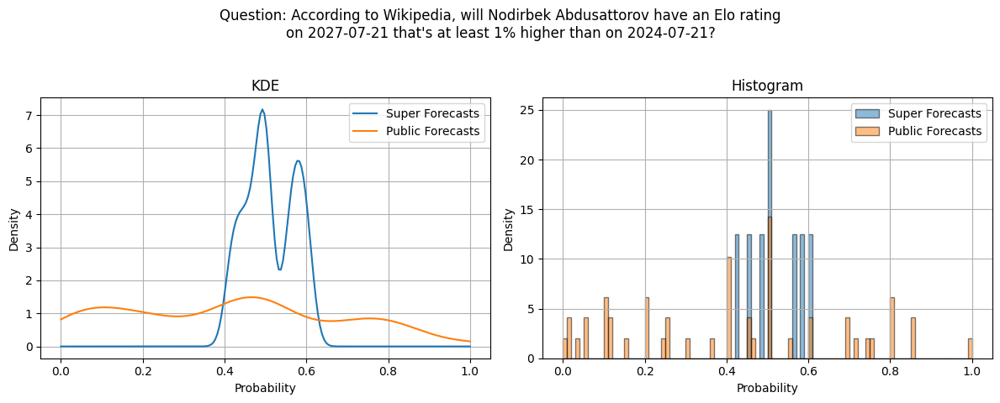

Question: According to Wikipedia, will Nodirbek Abdusattorov have an Elo rating
on 2027-07-21 that's at least 1% higher than on 2024-07-21?

Public Forecasts: mean=0.411, median=0.410, std=0.267
Super Forecasts: mean=0.511, median=0.500, std=0.059


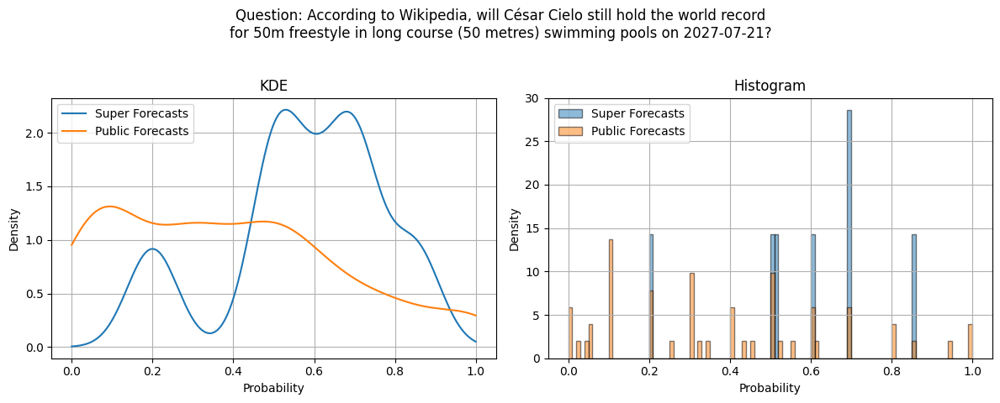

Question: According to Wikipedia, will César Cielo still hold the world record
for 50m freestyle in long course (50 metres) swimming pools on 2027-07-21?

Public Forecasts: mean=0.385, median=0.340, std=0.277
Super Forecasts: mean=0.580, median=0.600, std=0.192


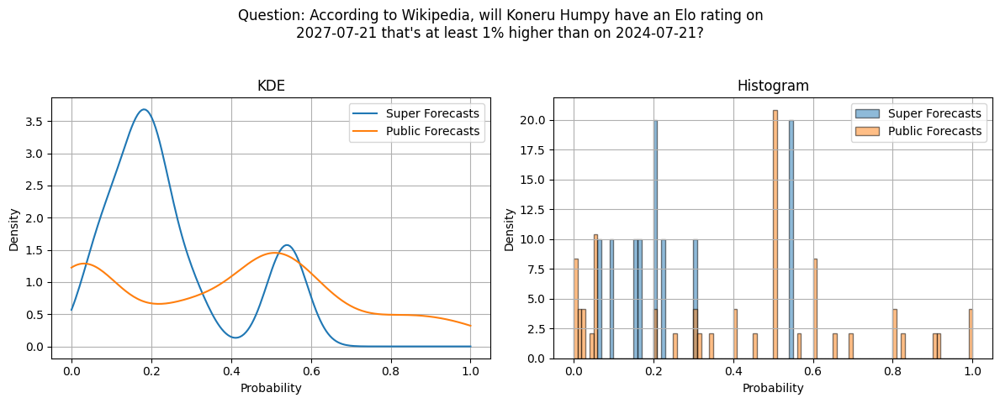

Question: According to Wikipedia, will Koneru Humpy have an Elo rating on
2027-07-21 that's at least 1% higher than on 2024-07-21?

Public Forecasts: mean=0.397, median=0.475, std=0.299
Super Forecasts: mean=0.246, median=0.200, std=0.160


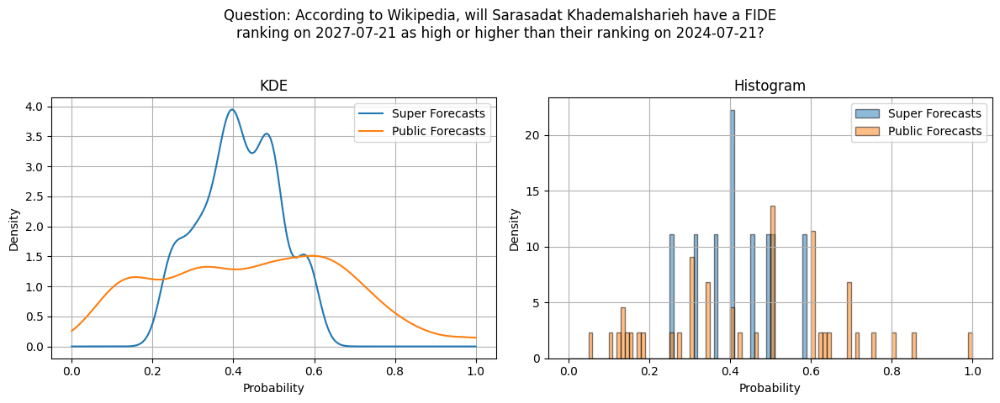

Question: According to Wikipedia, will Sarasadat Khademalsharieh have a FIDE
ranking on 2027-07-21 as high or higher than their ranking on 2024-07-21?

Public Forecasts: mean=0.449, median=0.485, std=0.228
Super Forecasts: mean=0.416, median=0.400, std=0.096


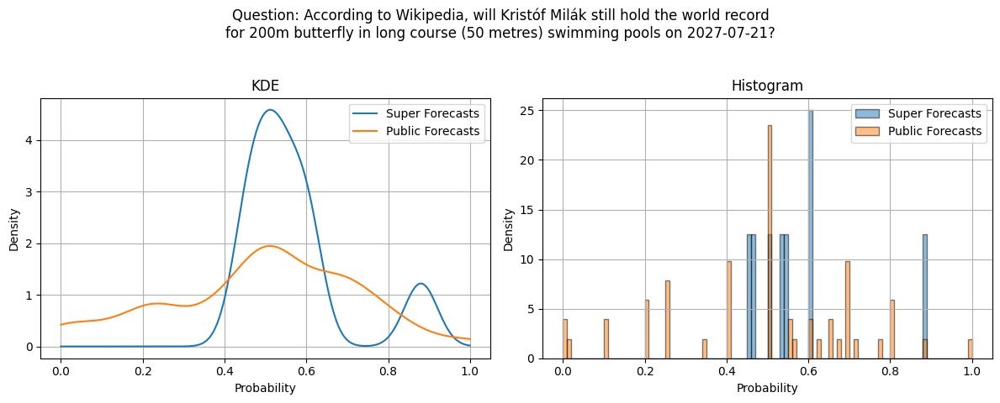

Question: According to Wikipedia, will Kristóf Milák still hold the world record
for 200m butterfly in long course (50 metres) swimming pools on 2027-07-21?

Public Forecasts: mean=0.488, median=0.500, std=0.232
Super Forecasts: mean=0.571, median=0.535, std=0.127


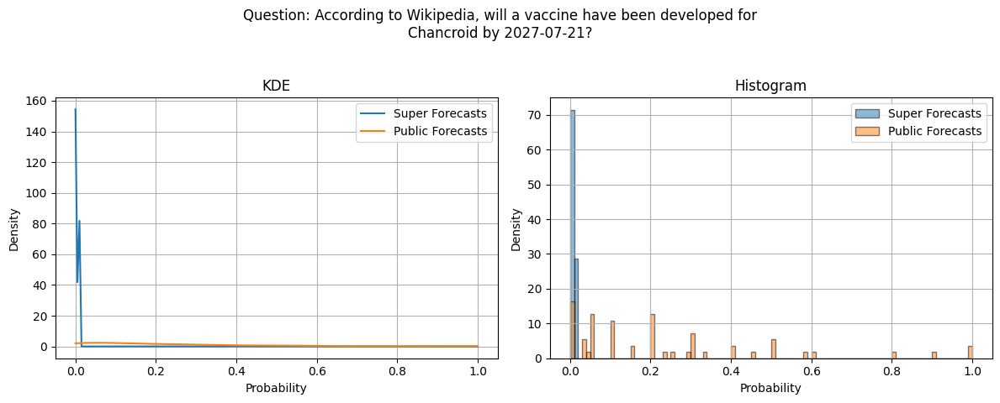

Question: According to Wikipedia, will a vaccine have been developed for
Chancroid by 2027-07-21?

Public Forecasts: mean=0.231, median=0.150, std=0.254
Super Forecasts: mean=0.004, median=0.001, std=0.004


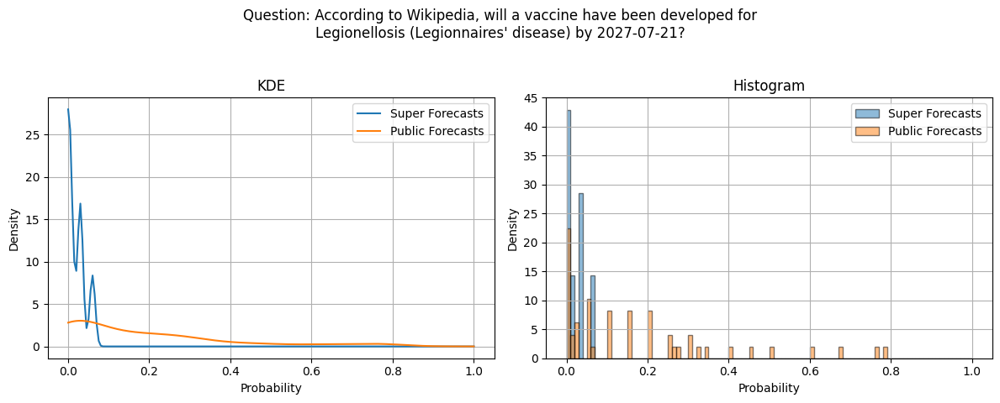

Question: According to Wikipedia, will a vaccine have been developed for
Legionellosis (Legionnaires' disease) by 2027-07-21?

Public Forecasts: mean=0.177, median=0.100, std=0.205
Super Forecasts: mean=0.019, median=0.010, std=0.021


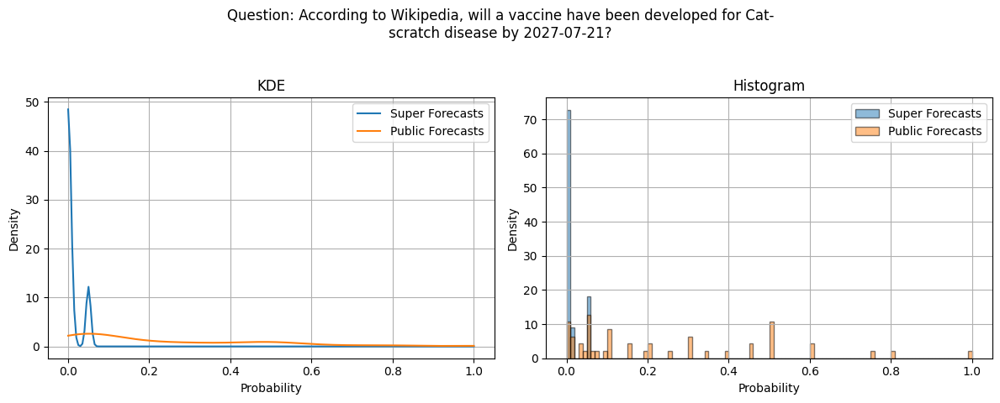

Question: According to Wikipedia, will a vaccine have been developed for Cat-
scratch disease by 2027-07-21?

Public Forecasts: mean=0.234, median=0.100, std=0.246
Super Forecasts: mean=0.010, median=0.000, std=0.019


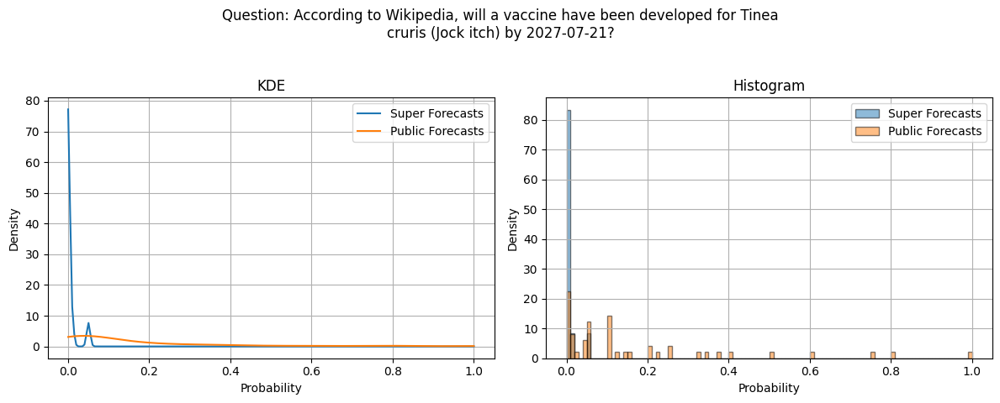

Question: According to Wikipedia, will a vaccine have been developed for Tinea
cruris (Jock itch) by 2027-07-21?

Public Forecasts: mean=0.159, median=0.050, std=0.226
Super Forecasts: mean=0.005, median=0.000, std=0.014


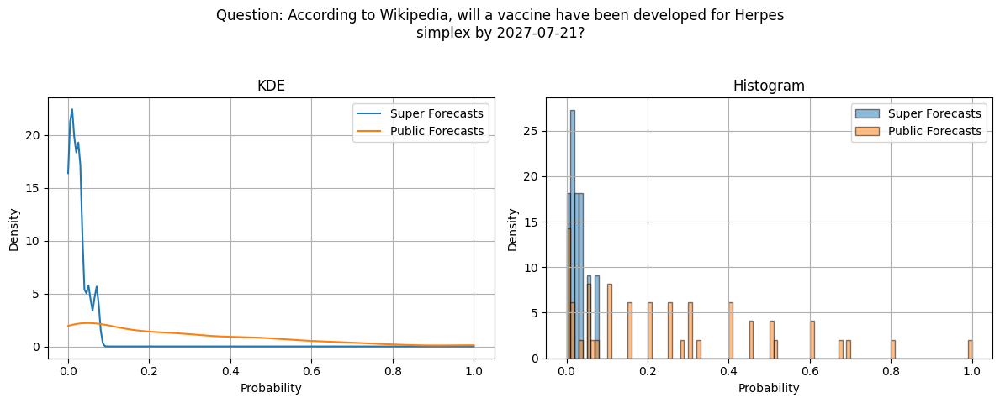

Question: According to Wikipedia, will a vaccine have been developed for Herpes
simplex by 2027-07-21?

Public Forecasts: mean=0.247, median=0.200, std=0.242
Super Forecasts: mean=0.023, median=0.020, std=0.020


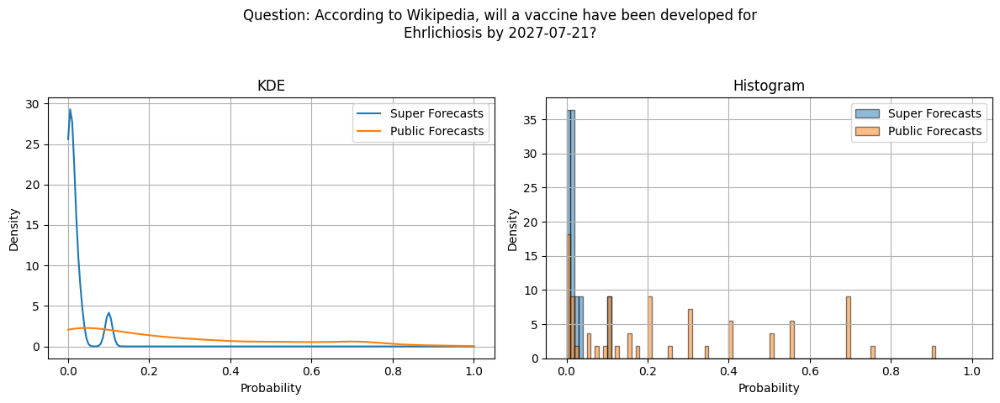

Question: According to Wikipedia, will a vaccine have been developed for
Ehrlichiosis by 2027-07-21?

Public Forecasts: mean=0.240, median=0.150, std=0.250
Super Forecasts: mean=0.017, median=0.010, std=0.028


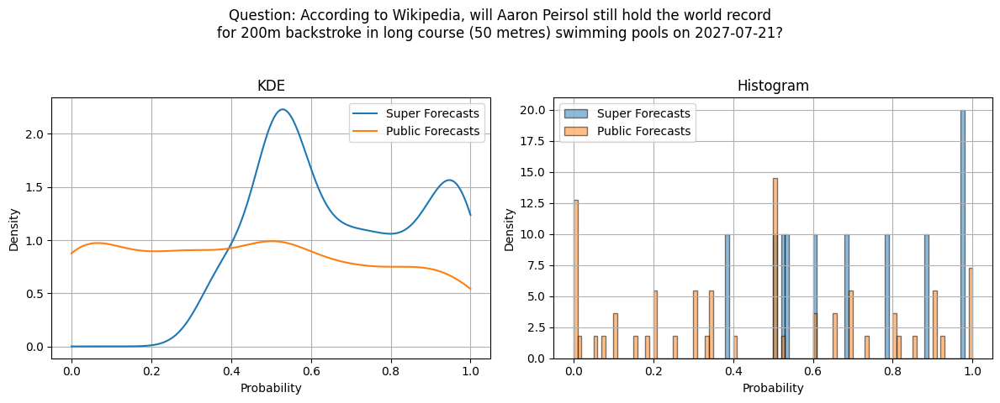

Question: According to Wikipedia, will Aaron Peirsol still hold the world record
for 200m backstroke in long course (50 metres) swimming pools on 2027-07-21?

Public Forecasts: mean=0.453, median=0.500, std=0.321
Super Forecasts: mean=0.682, median=0.645, std=0.199


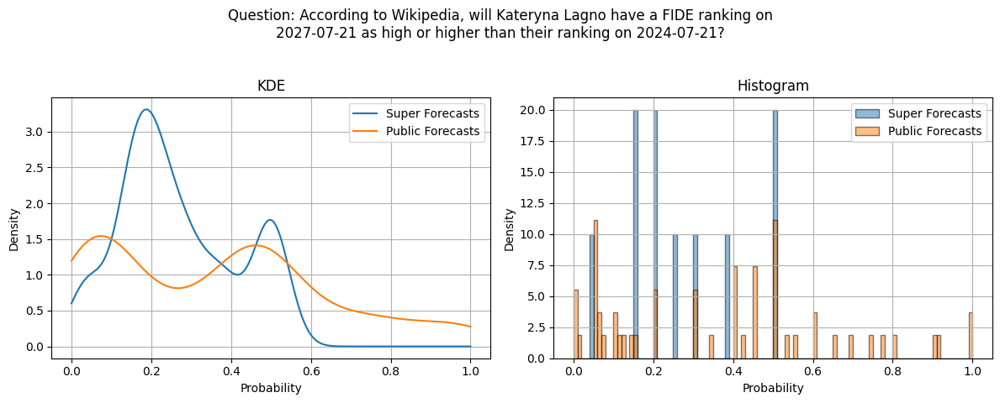

Question: According to Wikipedia, will Kateryna Lagno have a FIDE ranking on
2027-07-21 as high or higher than their ranking on 2024-07-21?

Public Forecasts: mean=0.364, median=0.400, std=0.280
Super Forecasts: mean=0.267, median=0.225, std=0.145


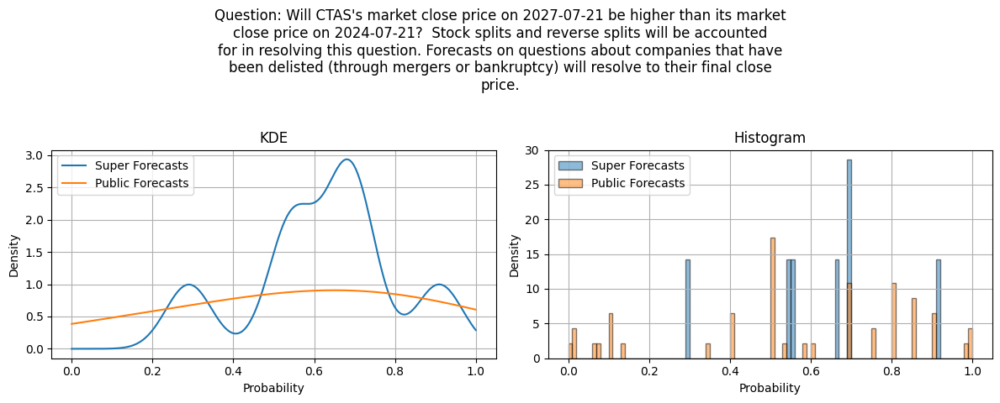

Question: Will CTAS's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.704, median=0.600, std=0.997
Super Forecasts: mean=0.621, median=0.660, std=0.177


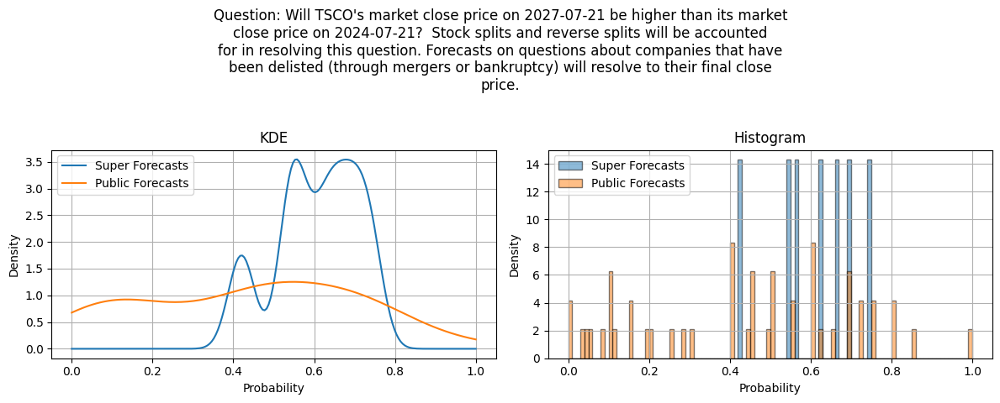

Question: Will TSCO's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.479, median=0.450, std=0.411
Super Forecasts: mean=0.606, median=0.620, std=0.101


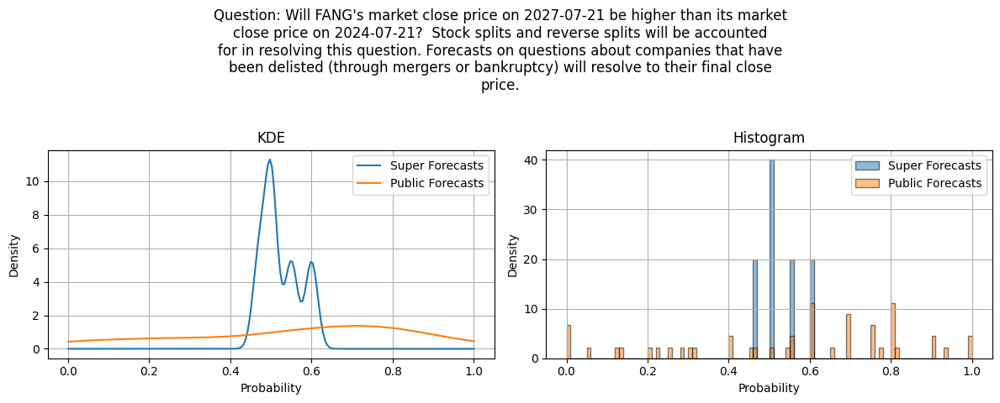

Question: Will FANG's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.598, median=0.600, std=0.367
Super Forecasts: mean=0.524, median=0.500, std=0.046


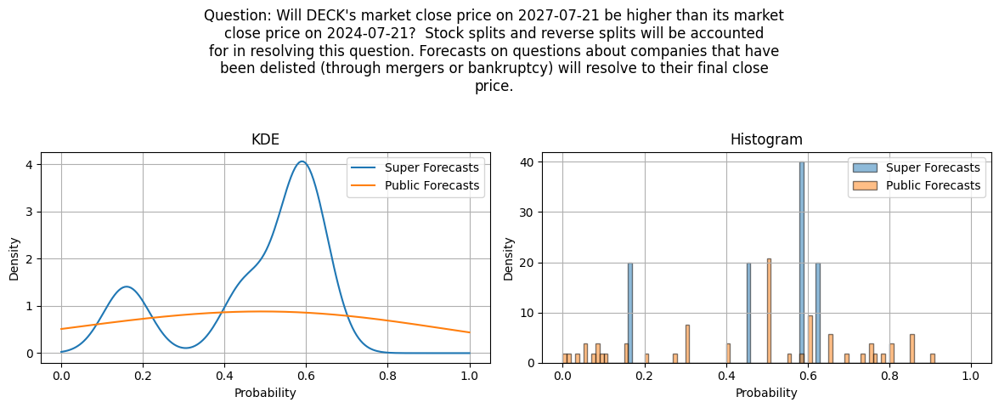

Question: Will DECK's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.613, median=0.500, std=1.140
Super Forecasts: mean=0.478, median=0.580, std=0.169


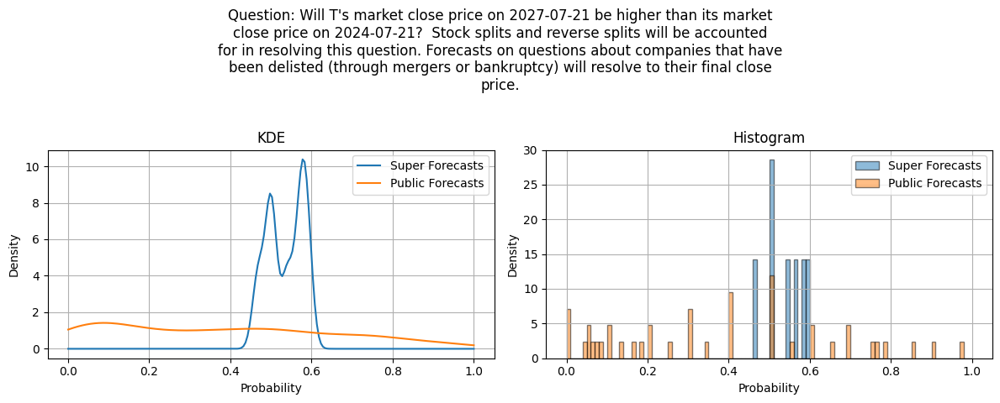

Question: Will T's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.377, median=0.375, std=0.277
Super Forecasts: mean=0.535, median=0.540, std=0.043


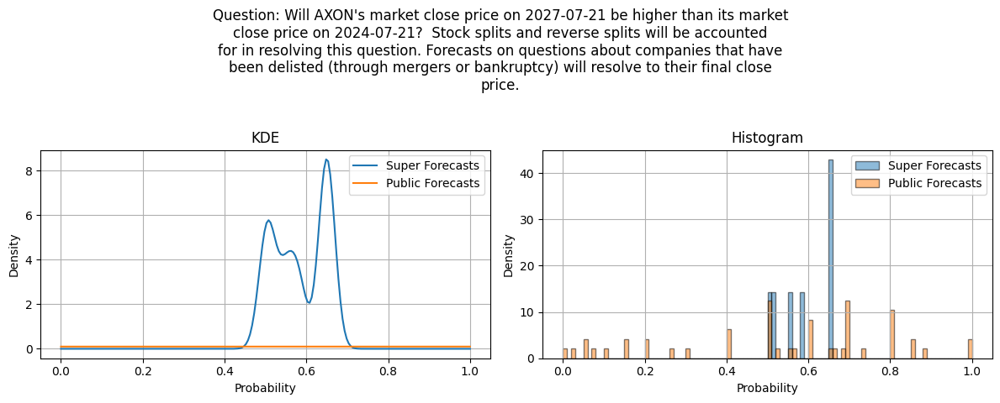

Question: Will AXON's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=2.402, median=0.600, std=12.827
Super Forecasts: mean=0.584, median=0.580, std=0.062


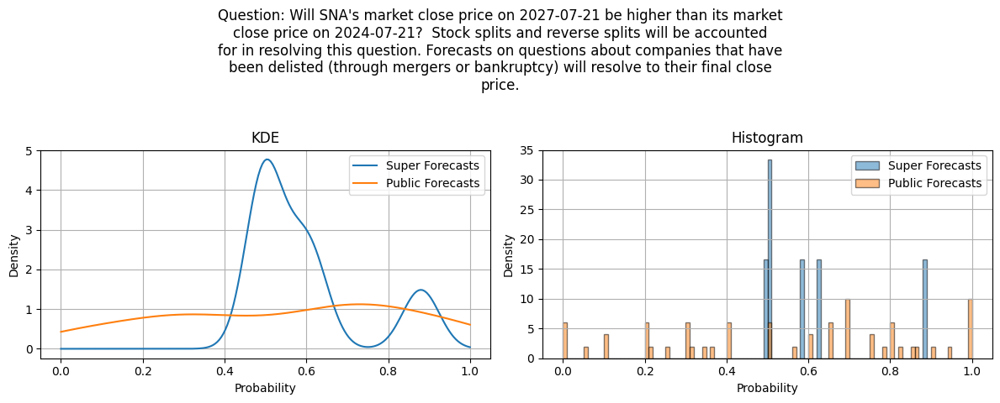

Question: Will SNA's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.586, median=0.600, std=0.420
Super Forecasts: mean=0.595, median=0.540, std=0.136


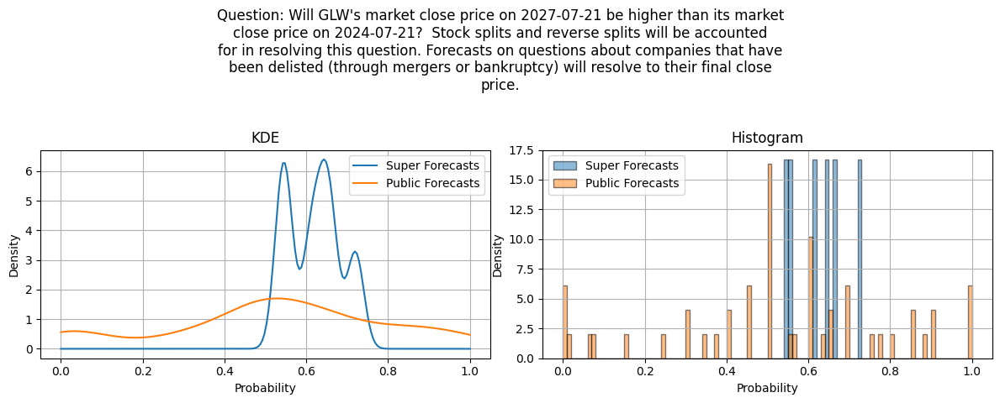

Question: Will GLW's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.527, median=0.500, std=0.270
Super Forecasts: mean=0.620, median=0.625, std=0.062


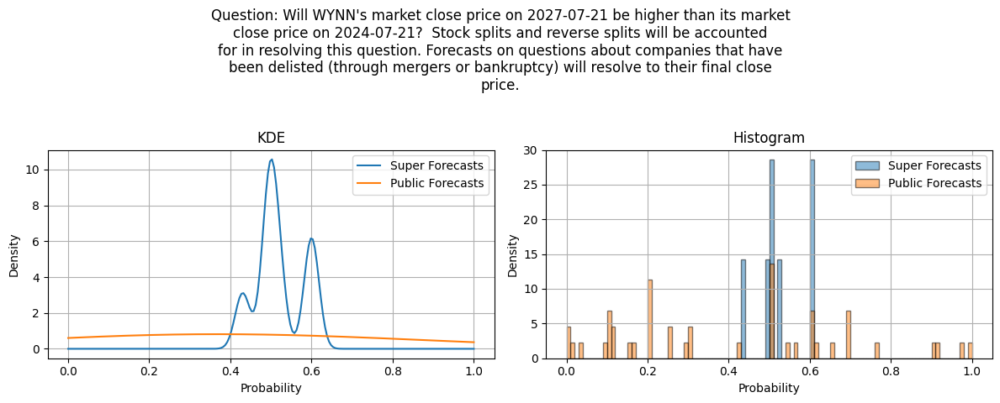

Question: Will WYNN's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.582, median=0.420, std=1.242
Super Forecasts: mean=0.520, median=0.500, std=0.057


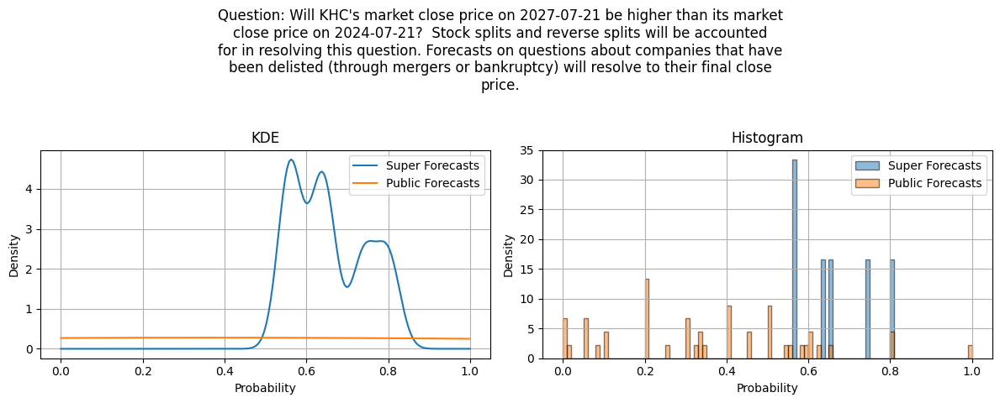

Question: Will KHC's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=1.031, median=0.340, std=4.548
Super Forecasts: mean=0.657, median=0.640, std=0.088


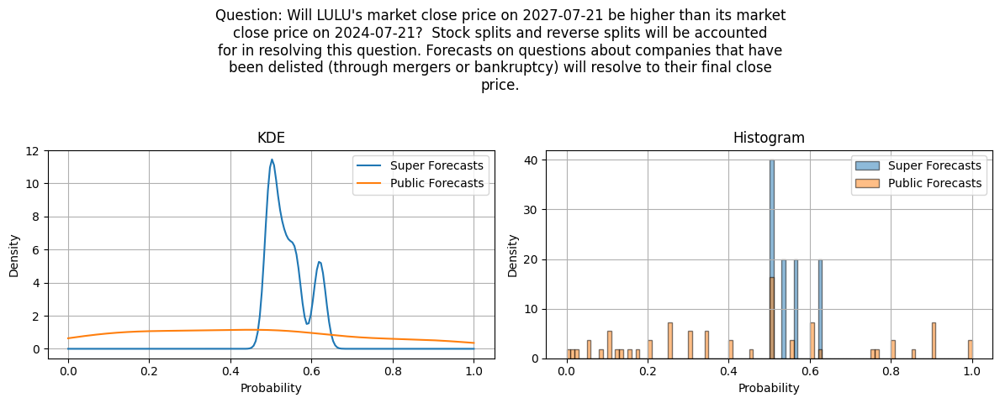

Question: Will LULU's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.479, median=0.475, std=0.438
Super Forecasts: mean=0.542, median=0.530, std=0.045


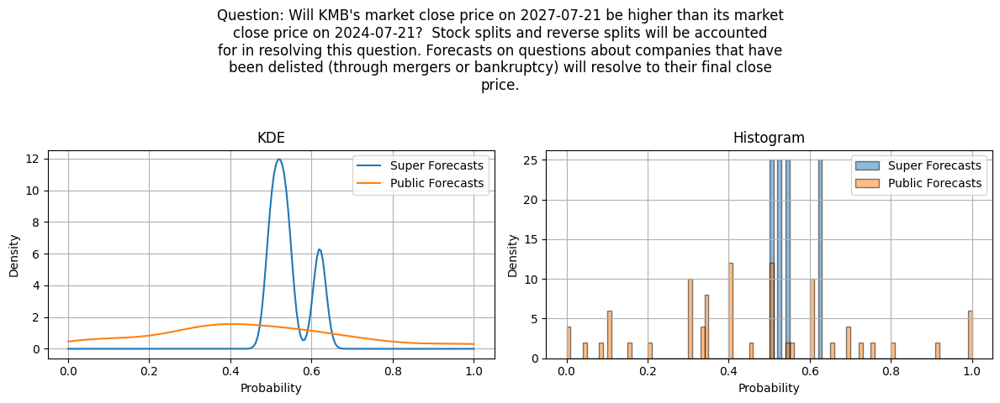

Question: Will KMB's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.494, median=0.425, std=0.330
Super Forecasts: mean=0.545, median=0.530, std=0.046


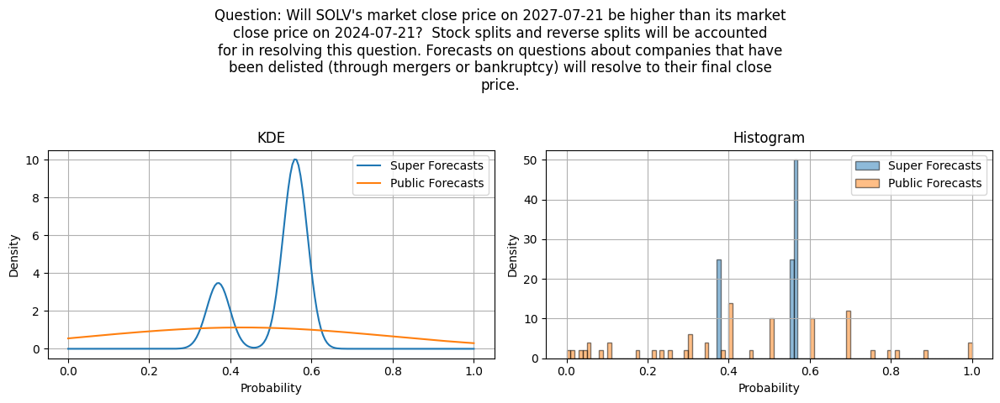

Question: Will SOLV's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.524, median=0.400, std=0.677
Super Forecasts: mean=0.512, median=0.555, std=0.083


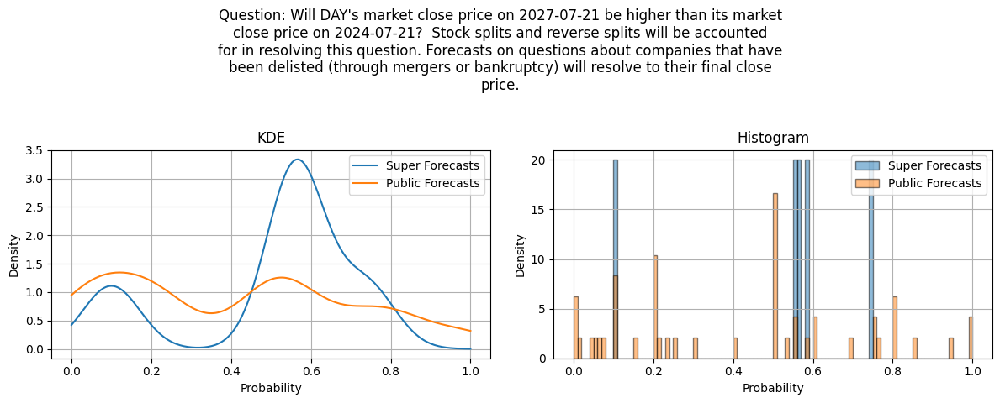

Question: Will DAY's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.411, median=0.500, std=0.297
Super Forecasts: mean=0.506, median=0.560, std=0.214


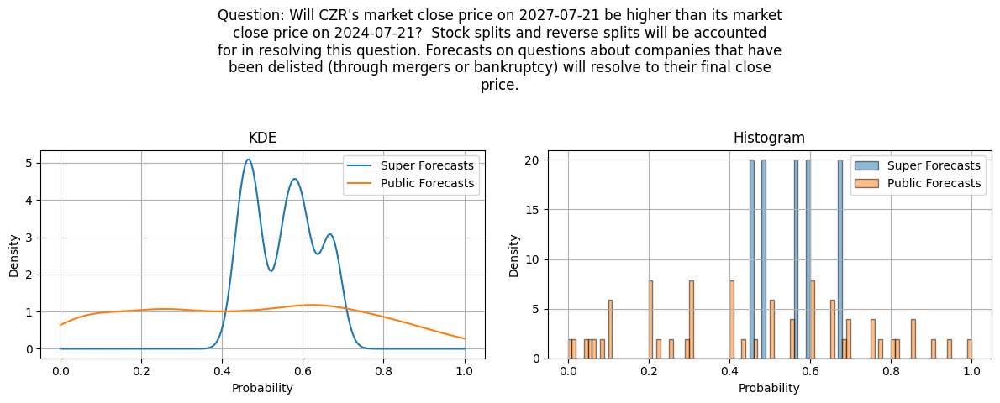

Question: Will CZR's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.456, median=0.460, std=0.276
Super Forecasts: mean=0.552, median=0.560, std=0.080


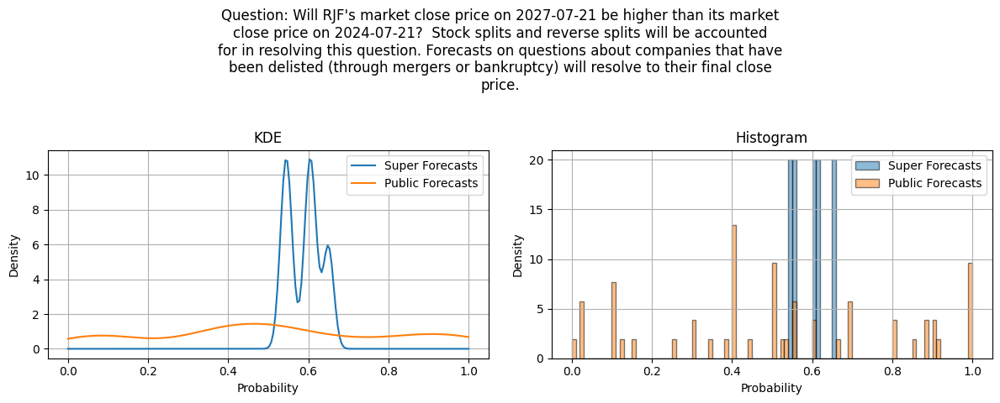

Question: Will RJF's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.512, median=0.500, std=0.297
Super Forecasts: mean=0.590, median=0.600, std=0.040


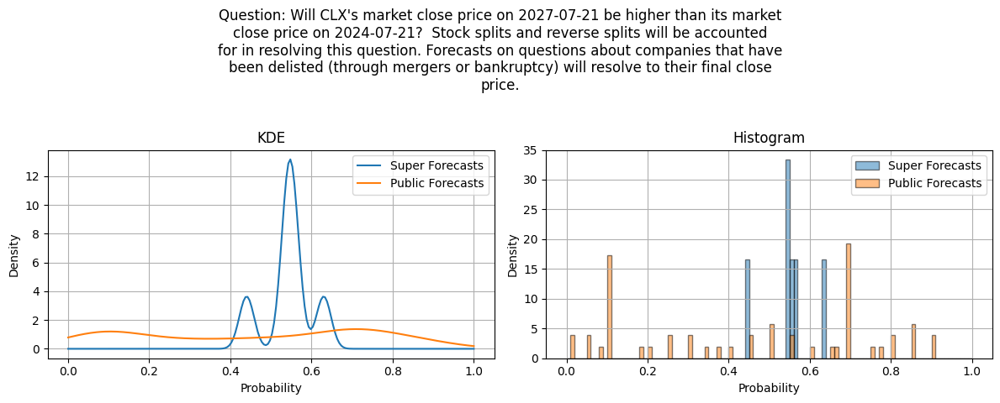

Question: Will CLX's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.471, median=0.500, std=0.312
Super Forecasts: mean=0.543, median=0.545, std=0.056


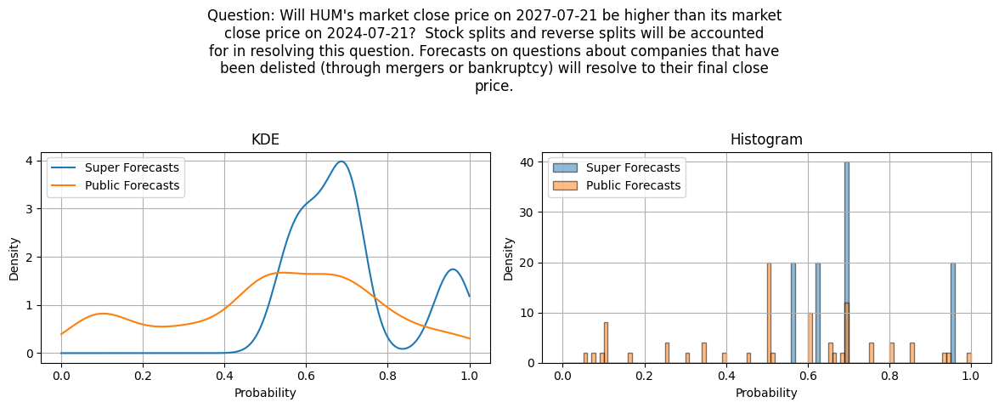

Question: Will HUM's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.523, median=0.505, std=0.249
Super Forecasts: mean=0.708, median=0.700, std=0.136


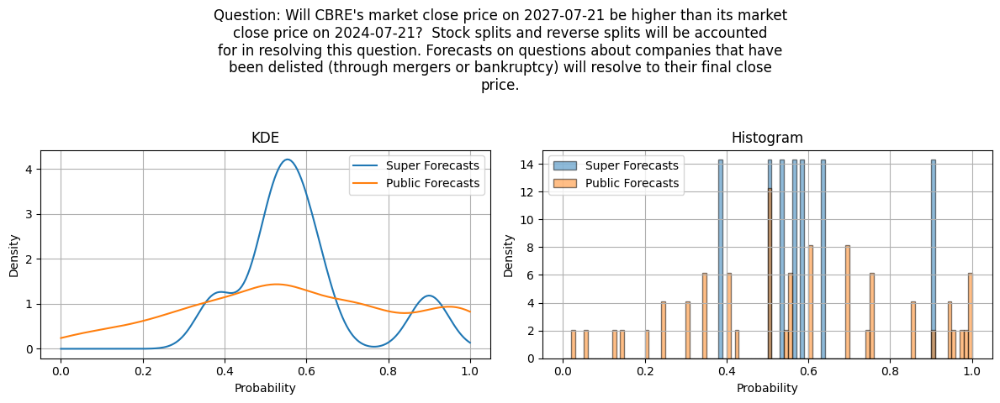

Question: Will CBRE's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.573, median=0.550, std=0.268
Super Forecasts: mean=0.583, median=0.560, std=0.148


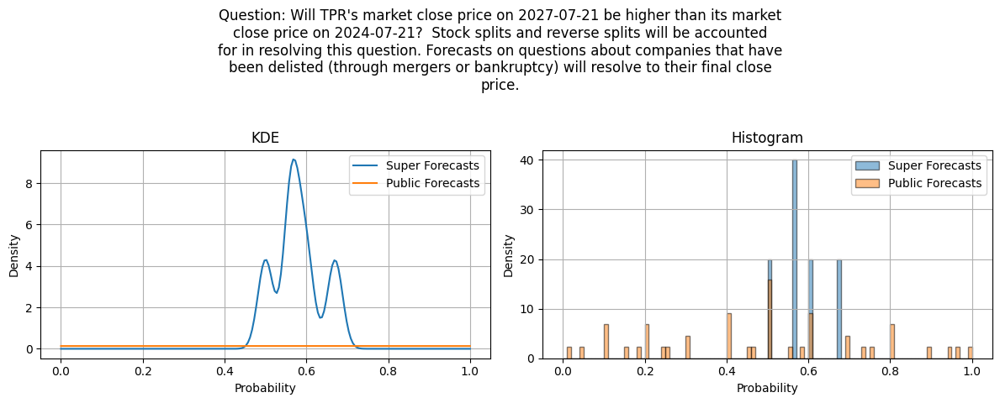

Question: Will TPR's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=2.436, median=0.500, std=9.198
Super Forecasts: mean=0.580, median=0.570, std=0.055


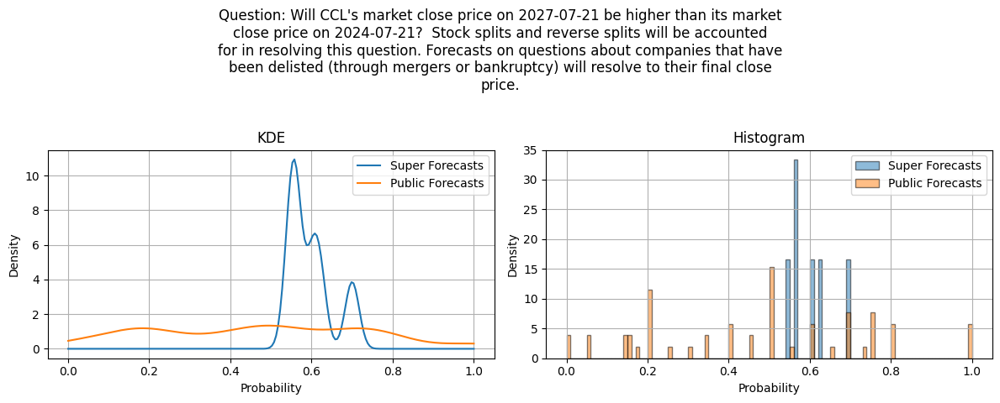

Question: Will CCL's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.468, median=0.500, std=0.267
Super Forecasts: mean=0.598, median=0.580, std=0.052


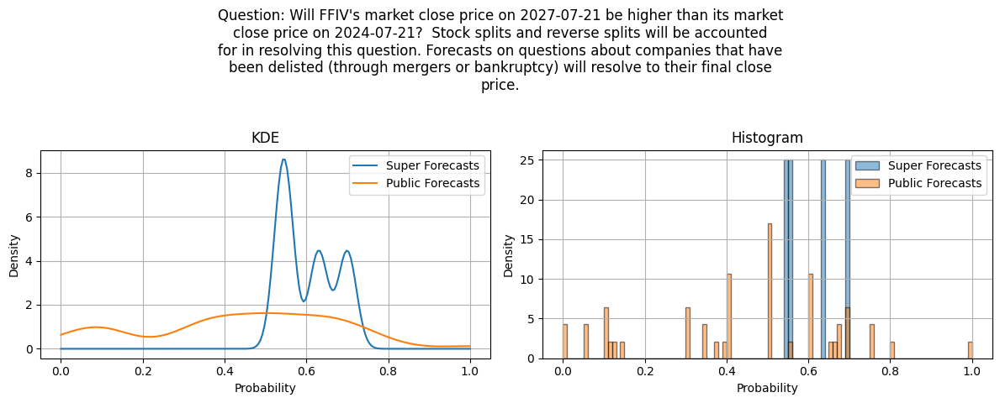

Question: Will FFIV's market close price on 2027-07-21 be higher than its market
close price on 2024-07-21?  Stock splits and reverse splits will be accounted
for in resolving this question. Forecasts on questions about companies that have
been delisted (through mergers or bankruptcy) will resolve to their final close
price.

Public Forecasts: mean=0.441, median=0.500, std=0.237
Super Forecasts: mean=0.605, median=0.590, std=0.065


In [16]:
for idx, question in populated_questions.iterrows():
    question_id = question['id']
    # if "vaccine" in question['populated_question'].lower():
    compare_forecast_densities(question_id, res_date, bw)

In [60]:
populated_questions

,id,source,question,resolution_criteria,background,market_info_open_datetime,market_info_close_datetime,market_info_resolution_criteria,url,freeze_datetime,freeze_datetime_value,freeze_datetime_value_explanation,source_intro,combination_of,resolution_dates,question_clean,nomic_category_easy,category_count,populated_question
90,45db5d06a001a6fa62eb9b23236adab43c56970d70a833ca206fa42a57f4b7e6,acled,"Will there be more than ten times as many fatalities in Niue for the 30 days before {resolution_date} compared to one plus the 30-day average of fatalities over the 360 days preceding {forecast_due_date}?\n\ne.g. If the forecast due date is 2024-01-01 and we have the following data:\nDate,fatalities\n2023-11-11,1\n2023-10-10,2\nto calculate one plus the 30-day average of fatalities over the preceding 360 days, we’d have: 1+(1+2)/12=1.25.\n\nIn this example, for the question to resolve positively, 13 (10 x 1.25) or more fatalities would need to occur in the 30 days leading up to the resolution.",Resolves to the value calculated from the ACLED dataset once the data is published.,"\nACLED classifies events into six distinct categories:\n\n1. Battles: violent interactions between two organized armed groups at a particular time and\n location;\n2. Protests: in-person public demonstrations of three or more participants in which the participants\n do not engage in violence, though violence may be used against them;\n3. Riots: violent events where demonstrators or mobs of three or more engage in violent or\n destructive acts, including but not limited to physical fights, rock throwing, property\n destruction, etc.;\n4. Explosions/Remote violence: incidents in which one side uses weapon types that, by their nature,\n are at range and widely destructive;\n5. Violence against civilians: violent events where an organized armed group inflicts violence upon\n unarmed non-combatants; and\n6. Strategic developments: contextually important information regarding incidents and activities of\n groups that are not recorded as any of the other event types, yet may trigger future events or\n contribute to political dynamics within and across states.\n\nDetailed information about the categories can be found at:\nhttps://acleddata.com/knowledge-base/codebook/#acled-events\n",N/A,N/A,N/A,https://acleddata.com/,2024-07-12T00:00:00+00:00,1.0,One plus the 30-day average of fatalities over the past 360 days in Niue. This reference value will potentially change as ACLED updates its dataset.,"The Armed Conflict Location & Event Data Project (ACLED) collects real-time data on the locations, dates, actors, fatalities, and types of all reported political violence and protest events around the world. You're going to predict how questions based on this data will resolve.",N/A,"[2024-07-28, 2024-08-20, 2024-10-19, 2025-01-17, 2025-07-21, 2027-07-21, 2029-07-20, 2034-07-19]",will there be more than ten times as many fatalities in niue for the 30 days before resolution_date compared to one plus the 30day average of fatalities over the 360 days preceding forecast_due_date eg if the forecast due date is 20240101 and we have the following data datefatalities 202311111 202310102 to calculate one plus the 30day average of fatalities over the preceding 360 days wed have 11212125 in this example for the question to resolve positively 13 10 x 125 or more fatalities would need to occur in the 30 days leading up to the resolution,Violent Incidents,22,"Will there be more than ten times as many fatalities in Niue for the 30 days before 2027-07-21 compared to one plus the 30-day average of fatalities over the 360 days preceding 2024-07-21?\n\ne.g. If the forecast due date is 2024-01-01 and we have the following data:\nDate,fatalities\n2023-11-11,1\n2023-10-10,2\nto calculate one plus the 30-day average of fatalities over the preceding 360 days, we’d have: 1+(1+2)/12=1.25.\n\nIn this example, for the question to resolve positively, 13 (10 x 1.25) or more fatalities would need to occur i